# Phase 2

2.1	Analysis of Literacy Rate vs Total Crimes.

2.2	 Analysis of the type of crime vs each state vs Literacy rate.

2.3	Analysis of year-on-year total crime rate.

2.4	 Analysis of area vs overall crime

2.5	 Analysis of Population vs overall Crime

2.6	Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.

Note: 

You need to be careful as this phase is whole state/ut wise analysis (not district-wise).

It is up to you which columns you want to keep or delete to make proper analysis"

The data has been collected from google, wikipedia and data.world

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('india-crimes.csv')
df

,State/UT,Year,population(total),Rural,Urban,Tot_Male,Tot_Female,Polulation_Literacy,Male_Literacy,Female_Litracy,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children,Crime Rate
0,A& N ISLANDS,2001,356152,239954,116198,192972,163180,253135.0,146831.0,106304,...,0,0,323,658,1386,0,34.0,1.0,0.0,184.752578
1,ANDHRA PRADESH,2001,76210007,55401067,20808940,38527413,37682594,39934323.0,23444788.0,16489535,...,7,7400,34344,130089,278982,2933,13669.0,512.0,270.0,170.698055
2,ARUNACHAL PRADESH,2001,1097968,870087,227881,579941,518027,484785.0,303281.0,181504,...,0,0,618,2342,5243,0,180.0,72.0,0.0,213.303120
3,ASSAM,2001,26655528,23216288,3439240,13777037,12878491,14015354.0,8188697.0,5826657,...,0,2010,9315,36877,81418,6,4048.0,0.0,18.0,138.346537
4,BIHAR,2001,82998509,74316709,8681800,43243795,39754714,31109577.0,20644376.0,10465201,...,83,2406,36667,88432,189612,1303,4489.0,83.0,83.0,106.546492
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,TAMIL NADU,2012,72867204,40524361,32342843,36680044,36477172,53274562.0,28573260.0,24701302,...,0,15499,124176,200474,415626,1647,6381.0,27.0,1036.0,275.122399
416,TRIPURA,2012,3717661,3088869,628792,1889371,1826534,2897340.0,1538903.0,1355550,...,0,10,1742,6264,13461,76,1559.0,29.0,20.0,168.493039
417,UTTAR PRADESH,2012,202226609,159783555,42443054,107092522,96666476,118889202.0,70418482.0,48470720,...,0,14406,68538,198093,444403,6202,23033.0,44.0,6033.0,97.955952
418,UTTARAKHAND,2012,10260421,7670906,2589515,5240528,5136562,7100774.0,3971891.0,3128883,...,0,670,2118,8882,20122,33,1055.0,3.0,122.0,86.565649


In [3]:
#Checking the dimentions of the dataset

df.shape

(420, 48)

In [4]:
#Checking the columns of the dataset

df.columns.to_list()

['State/UT',
 'Year',
 'population(total)',
 'Rural',
 'Urban',
 'Tot_Male',
 'Tot_Female',
 'Polulation_Literacy',
 'Male_Literacy',
 'Female_Litracy',
 'Litracy_rate',
 'Area (km2)',
 'MURDER',
 'ATTEMPT TO MURDER',
 'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',
 'RAPE',
 'CUSTODIAL RAPE',
 'OTHER RAPE',
 'KIDNAPPING & ABDUCTION',
 'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
 'KIDNAPPING AND ABDUCTION OF OTHERS',
 'DACOITY',
 'PREPARATION AND ASSEMBLY FOR DACOITY',
 'ROBBERY',
 'BURGLARY',
 'THEFT',
 'AUTO THEFT',
 'OTHER THEFT',
 'RIOTS',
 'CRIMINAL BREACH OF TRUST',
 'CHEATING',
 'COUNTERFIETING',
 'ARSON',
 'HURT/GREVIOUS HURT',
 'DOWRY DEATHS',
 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
 'INSULT TO MODESTY OF WOMEN',
 'CRUELTY BY HUSBAND OR HIS RELATIVES',
 'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
 'CAUSING DEATH BY NEGLIGENCE',
 'OTHER IPC CRIMES',
 'TOTAL IPC CRIMES',
 'Total Crimes',
 'tot_crimes_sc',
 'total crime against women',
 'Total crimes against ST

In [5]:
# Checking the types of columns

df.dtypes

State/UT                                                object
Year                                                     int64
population(total)                                        int64
Rural                                                    int64
Urban                                                    int64
Tot_Male                                                 int64
Tot_Female                                               int64
Polulation_Literacy                                    float64
Male_Literacy                                          float64
Female_Litracy                                           int64
Litracy_rate                                           float64
Area (km2)                                               int64
MURDER                                                   int64
ATTEMPT TO MURDER                                        int64
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER                int64
RAPE                                                   

In [6]:
# Checking the null values

df.isnull().sum()

State/UT                                                0
Year                                                    0
population(total)                                       0
Rural                                                   0
Urban                                                   0
Tot_Male                                                0
Tot_Female                                              0
Polulation_Literacy                                     0
Male_Literacy                                           0
Female_Litracy                                          0
Litracy_rate                                            0
Area (km2)                                              0
MURDER                                                  0
ATTEMPT TO MURDER                                       0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER               0
RAPE                                                    0
CUSTODIAL RAPE                                          0
OTHER RAPE    

There are missing values in 'total crime against women', 'Total crimes against STs ' and 'Total crime against children'.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 48 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   State/UT                                             420 non-null    object 
 1   Year                                                 420 non-null    int64  
 2   population(total)                                    420 non-null    int64  
 3   Rural                                                420 non-null    int64  
 4   Urban                                                420 non-null    int64  
 5   Tot_Male                                             420 non-null    int64  
 6   Tot_Female                                           420 non-null    int64  
 7   Polulation_Literacy                                  420 non-null    float64
 8   Male_Literacy                                        420 non-null    f

<Axes: >

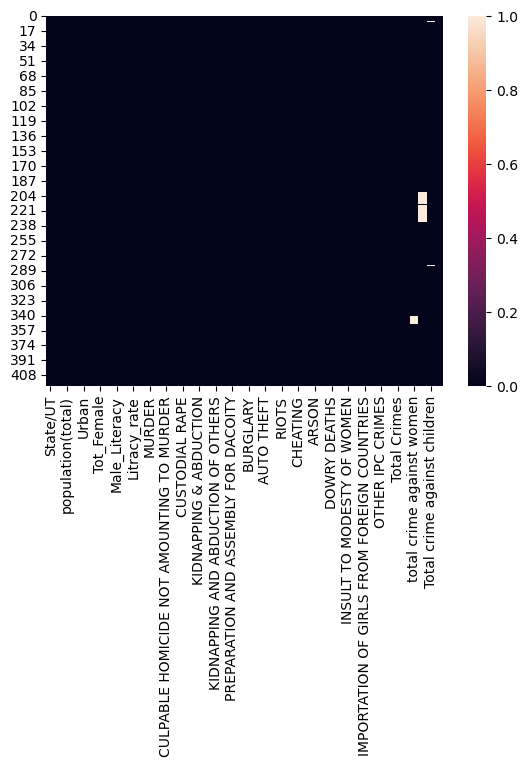

In [8]:
# Using heatmap to visualize the null values.

sns.heatmap(df.isnull())

In [11]:
# Checking again for Null values

df.isnull().sum()

State/UT                                               0
Year                                                   0
population(total)                                      0
Rural                                                  0
Urban                                                  0
Tot_Male                                               0
Tot_Female                                             0
Polulation_Literacy                                    0
Male_Literacy                                          0
Female_Litracy                                         0
Litracy_rate                                           0
Area (km2)                                             0
MURDER                                                 0
ATTEMPT TO MURDER                                      0
CULPABLE HOMICIDE NOT AMOUNTING TO MURDER              0
RAPE                                                   0
CUSTODIAL RAPE                                         0
OTHER RAPE                     

In [12]:
# Checking for diblicate values

df.duplicated().sum()

0

In [14]:
#Checking for unique values of each column.

for i in df.columns:
    print(df[i].unique())
    print("\n")

['A& N ISLANDS' 'ANDHRA PRADESH' 'ARUNACHAL PRADESH' 'ASSAM' 'BIHAR'
 'CHANDIGARH' 'CHHATTISGARH' 'D & N HAVELI' 'DAMAN & DIU' 'DELHI' 'GOA'
 'GUJARAT' 'HARYANA' 'HIMACHAL PRADESH' 'JAMMU & KASHMIR' 'JHARKHAND'
 'KARNATAKA' 'KERALA' 'LAKSHADWEEP' 'MADHYA PRADESH' 'MAHARASHTRA'
 'MANIPUR' 'MEGHALAYA' 'MIZORAM' 'NAGALAND' 'ODISHA' 'PUDUCHERRY' 'PUNJAB'
 'RAJASTHAN' 'SIKKIM' 'TAMIL NADU' 'TRIPURA' 'UTTAR PRADESH' 'UTTARAKHAND'
 'WEST BENGAL']


[2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012]


[   356152  76210007   1097968  26655528  82998509    900635  20833803
    220490    158204  13850507   1347668  50671017  21144564   6077900
  10143700  26945829  52850562  31841374     60650   6038023    968786
   2166788   2318822    888573   1990036  36804660    974345  24358999
  56507188    540851  62405679   3199203 166197921   8489349  80176197
    358609  77048317   1123221  27082016  84907474    915045  21271312
    230411    165164  14113665   1358447  51583095  21525166   6

In [38]:
#Checking the value counts of each column.

for i in df.columns:
    print(df[i].value_counts())
    print("\n")

A& N ISLANDS         12
PUDUCHERRY           12
MAHARASHTRA          12
MANIPUR              12
MEGHALAYA            12
MIZORAM              12
NAGALAND             12
ODISHA               12
PUNJAB               12
LAKSHADWEEP          12
RAJASTHAN            12
SIKKIM               12
TAMIL NADU           12
TRIPURA              12
UTTAR PRADESH        12
UTTARAKHAND          12
MADHYA PRADESH       12
KERALA               12
ANDHRA PRADESH       12
DAMAN & DIU          12
ARUNACHAL PRADESH    12
ASSAM                12
BIHAR                12
CHANDIGARH           12
CHHATTISGARH         12
D & N HAVELI         12
DELHI                12
KARNATAKA            12
GOA                  12
GUJARAT              12
HARYANA              12
HIMACHAL PRADESH     12
JAMMU & KASHMIR      12
JHARKHAND            12
WEST BENGAL          12
Name: State/UT, dtype: int64


2001    35
2002    35
2003    35
2004    35
2005    35
2006    35
2007    35
2008    35
2009    35
2010    35
2011    35
2012    

In [15]:
#Checking the number of unique values in each column

df.nunique().to_frame("Number of unique values")

,Number of unique values
State/UT,35
Year,12
population(total),420
Rural,418
Urban,420
Tot_Male,419
Tot_Female,420
Polulation_Literacy,420
Male_Literacy,418
Female_Litracy,420


In [10]:
# Since the three of the columns with missing values are with numerical data, we filling in the missing data with finding the mean.

df['total crime against women']=df['total crime against women'].fillna(df['total crime against women'].mean())
df['Total crimes against STs']=df['Total crimes against STs'].fillna(df['Total crimes against STs'].mean())
df['Total crime against children']=df['Total crime against children'].fillna(df['Total crime against children'].mean())
     

### Description of the dataset

In [16]:
# for numerical data

df.describe()

,Year,population(total),Rural,Urban,Tot_Male,Tot_Female,Polulation_Literacy,Male_Literacy,Female_Litracy,Litracy_rate,...,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Total Crimes,tot_crimes_sc,total crime against women,Total crimes against STs,Total crime against children,Crime Rate
count,420.000000,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,4.200000e+02,420.000000,...,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000,420.000000
mean,2006.500000,3.210516e+07,2.325755e+07,8.964941e+06,1.659190e+07,1.560647e+07,1.901633e+07,1.109371e+07,7.963801e+06,74.304929,...,2.123810,2385.038095,23342.764286,57005.423810,123764.880952,14884.821429,5141.299270,185.077519,587.267943,234.148195
std,3.456169,4.090185e+07,3.099496e+07,1.152126e+07,2.116180e+07,1.960728e+07,2.336704e+07,1.379373e+07,9.675254e+06,9.942087,...,8.914278,3665.682348,29318.488594,66190.228036,143105.441854,91151.189568,6527.890804,377.471210,1033.982273,868.709314
min,2001.000000,6.065000e+04,3.368300e+04,2.696700e+04,3.113100e+04,2.951900e+04,4.468300e+04,2.451100e+04,2.017200e+04,47.000000,...,0.000000,0.000000,5.000000,31.000000,72.000000,0.000000,0.000000,0.000000,0.000000,18.551635
25%,2003.750000,1.302120e+06,7.259828e+05,5.533638e+05,6.866452e+05,6.526302e+05,8.984955e+05,4.681158e+05,4.343975e+05,66.382500,...,0.000000,35.000000,693.750000,2408.500000,5390.250000,0.000000,134.750000,0.000000,26.000000,115.283230
50%,2006.500000,1.507539e+07,8.597313e+06,3.753114e+06,8.333013e+06,7.219828e+06,1.063014e+07,6.315500e+06,4.422024e+06,74.495000,...,0.000000,463.500000,10414.500000,30116.500000,65035.500000,23.500000,2617.000000,12.000000,104.000000,182.181858
75%,2009.250000,5.705401e+07,3.649124e+07,1.504703e+07,2.947709e+07,2.766350e+07,3.261374e+07,2.000440e+07,1.341985e+07,82.187500,...,0.000000,3025.000000,41774.750000,109178.500000,232218.750000,710.500000,7459.500000,185.077519,628.750000,224.555786
max,2012.000000,2.022266e+08,1.597836e+08,4.826007e+07,1.070925e+08,9.666648e+07,1.188892e+08,7.041848e+07,4.847072e+07,94.500000,...,83.000000,16076.000000,124176.000000,220335.000000,472008.000000,653748.000000,30585.000000,2894.000000,6033.000000,17675.007690


In [17]:
# for object data

df.describe(include="object")

,State/UT
count,420
unique,35
top,A& N ISLANDS
freq,12


# Data Analysis and Visualization

## 2.1	Analysis of Literacy Rate vs Total Crimes.

In [23]:
df.groupby('Litracy_rate')['Total Crimes'].sum().sort_values(ascending = False).to_frame()

,Total Crimes
Litracy_rate,
66.09,650365
81.77,472008
93.10,468579
80.65,468283
82.34,466623
...,...
87.39,119
89.62,91
93.47,89


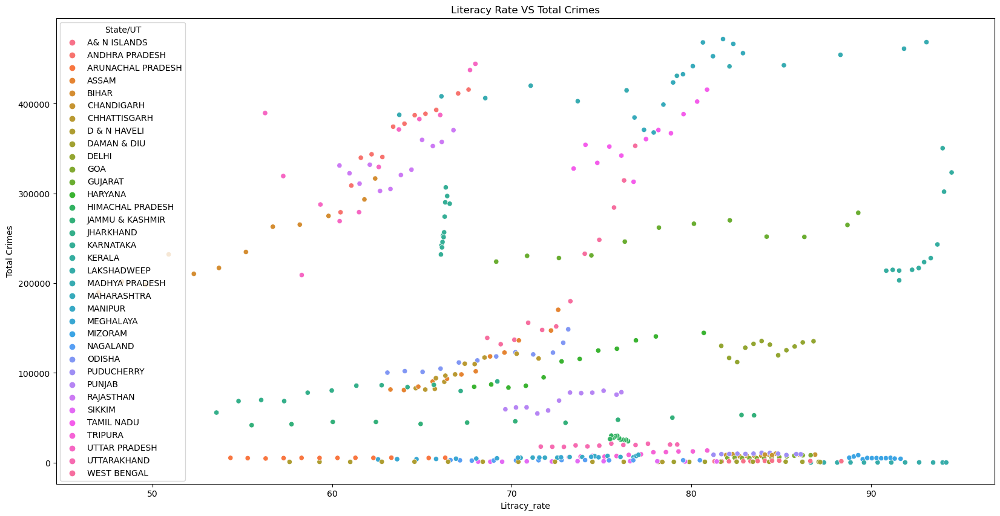

In [46]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='Total Crimes', hue='State/UT', data=df)
plt.title('Literacy Rate VS Total Crimes')

plt.show()

The above graph represents Literacy Rate vs Total Crimes state/ut wise.
    

In [52]:
# Correlation between Literacy Crime and Total Crimes

df[['Litracy_rate', 'Total Crimes']].corr()

,Litracy_rate,Total Crimes
Litracy_rate,1.000000,-0.167573
Total Crimes,-0.167573,1.000000


There is a mild negative correlation between Literacy rate and Total Crimes, which means with increasing the literacy rate the total crimes degrease.

<function matplotlib.pyplot.show(close=None, block=None)>

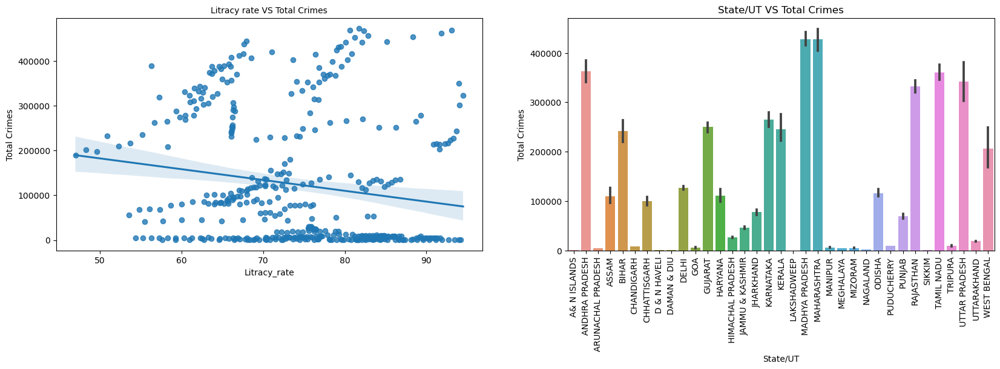

In [158]:
plt.figure(figsize=(20,5), facecolor='white')

# Litracy rate vs Total Crimes

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='Total Crimes', data=df)
plt.title('Litracy rate VS Total Crimes', fontsize=10)

# State/UT VS Total Crimes

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='Total Crimes', data=df)
plt.title('State/UT VS Total Crimes')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the total crimes degrease.
- Madhaya Pradesh and Maharashtra have the highest number of reported crime cases.

<function matplotlib.pyplot.show(close=None, block=None)>

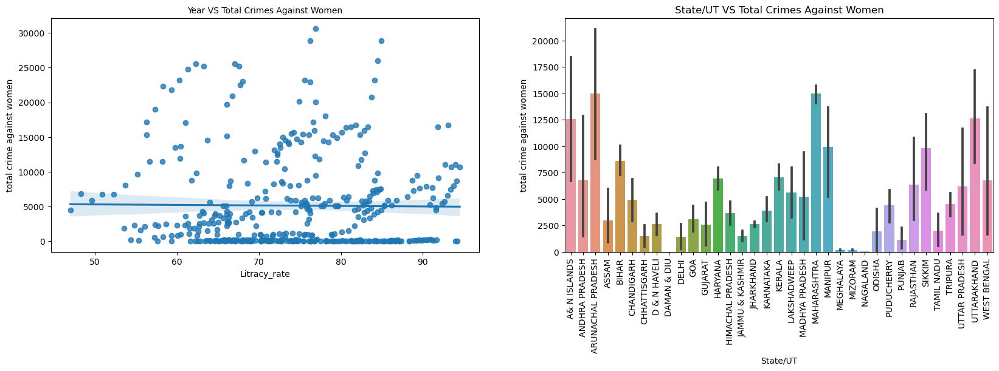

In [159]:
plt.figure(figsize=(20,5), facecolor='white')

# Litracy Rate vs Total Crimes Against Women

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='total crime against women', data=df)
plt.title('Year VS Total Crimes Against Women', fontsize=10)

# State/UT VS Total Crimes Against Women

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='total crime against women', data=df)
plt.title('State/UT VS Total Crimes Against Women')
plt.xticks(rotation=90, fontsize=10)

plt.show

- The litracy rate stays pretty much the same with increasing the number of crimes against women.
- Arunachal Pradesh and Maharashtra have the highest number of reported cases of crimes against women.

<function matplotlib.pyplot.show(close=None, block=None)>

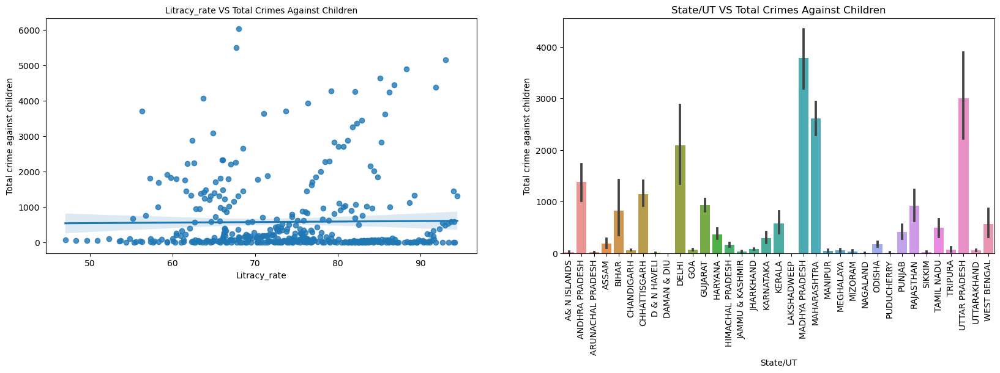

In [163]:
plt.figure(figsize=(20,5), facecolor='white')

# Litracy Rate vs Total Crimes Against Children

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='Total crime against children', data=df)
plt.title('Litracy_rate VS Total Crimes Against Children', fontsize=10)

# State/UT VS Total Crimes Against Children

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='Total crime against children', data=df)
plt.title('State/UT VS Total Crimes Against Children')
plt.xticks(rotation=90, fontsize=10)

plt.show

- The litracy rate stays pretty much the same with increasing the number of crimes against women.
- Madhaya Pradesh and Uttar Pradesh have the highest number of reported cases of crimes against children.

<function matplotlib.pyplot.show(close=None, block=None)>

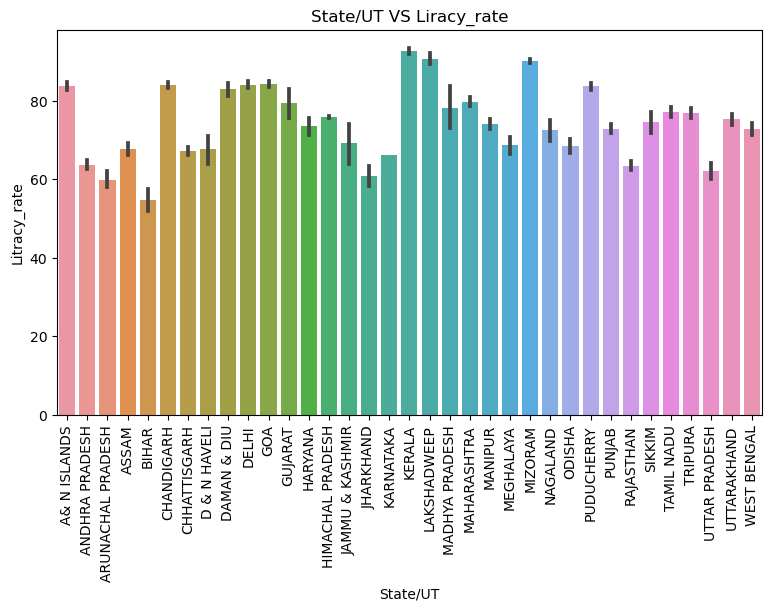

In [165]:
# Litracy Rate VS State/UT

plt.figure(figsize=(20,5), facecolor='white')

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='Litracy_rate', data=df)
plt.title('State/UT VS Liracy_rate')
plt.xticks(rotation=90, fontsize=10)

plt.show

States like Kerala, Lakshadweep and Mizoram have the highest litracy rate. Bihar has the lowest litracy rate.

## 2.2	 Analysis of the type of crime vs each state vs Literacy rate.

There are many different crime types in the dataset, so we are going to analyse every one separately.

### 1) Murder Cases Analysis

In [53]:
murder = df[['State/UT', 'Litracy_rate', 'MURDER']]

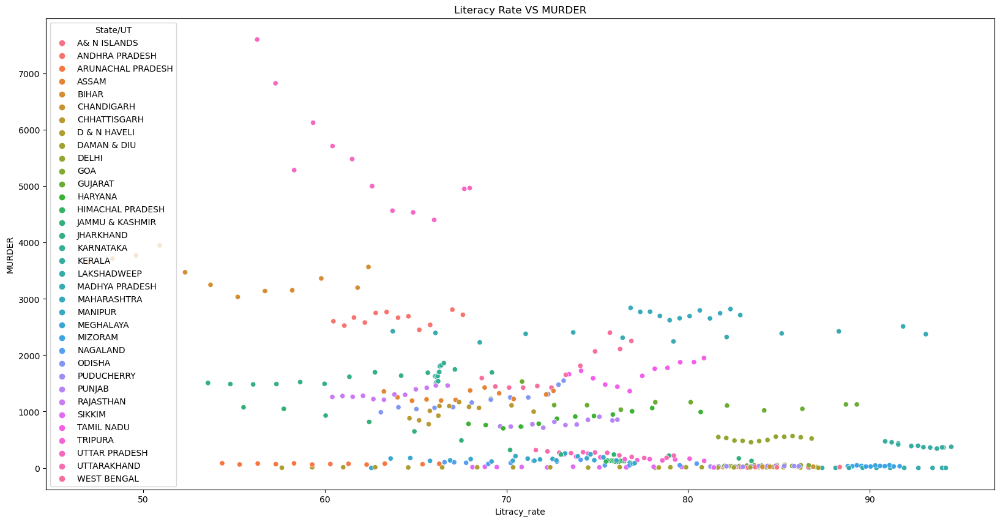

In [54]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='MURDER', hue='State/UT', data=df)
plt.title('Literacy Rate VS MURDER')

plt.show()

The above graph represents Literacy Rate vs Murder state/ut wise.

<function matplotlib.pyplot.show(close=None, block=None)>

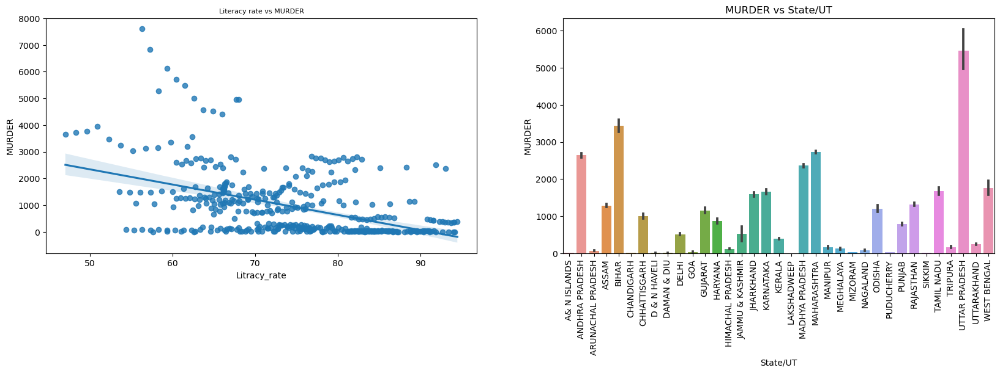

In [98]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs MURDER

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='MURDER', data=df)
plt.title('Literacy rate vs MURDER', fontsize=8)

# MURDER vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='MURDER', data=df)
plt.title('MURDER vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

With increasing the literacy rate the murder cases decrease.

The state with the highest number of murder cases is Uttar Pradesh, there is a significant difference between Uttar Pradesh and the rest of the states. Second is Bihar. The lowest number of reported murder cases are in Lakshadweep, D&N Haveli and Daman & Diu.

Kerala and Lakshadweep has the highest literacy rate. Lakshadweep is also with the lowest Murder cases rate state.

### 2) Attempt to Murder Cases Analysis

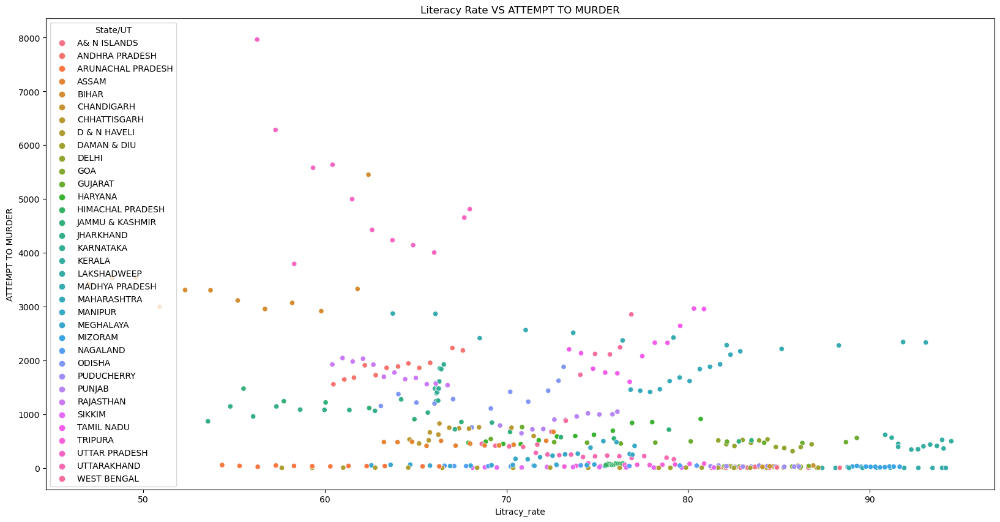

In [70]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='ATTEMPT TO MURDER', hue='State/UT', data=df)
plt.title('Literacy Rate VS ATTEMPT TO MURDER')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

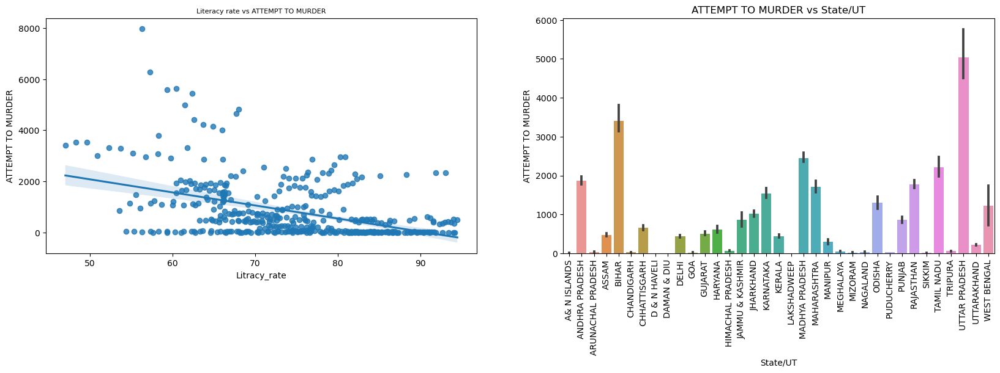

In [99]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs ATTEMPT TO MURDER

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='ATTEMPT TO MURDER', data=df)
plt.title('Literacy rate vs ATTEMPT TO MURDER', fontsize=8)

# ATTEMPT TO MURDER vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='ATTEMPT TO MURDER', data=df)
plt.title('ATTEMPT TO MURDER vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

With increasing the literacy rate the attempt to murder cases decrease.

The state with the highest number of attempt to murder cases is Uttar Pradesh, there is a significant difference between Uttar Pradesh and the rest of the states. Second is Bihar. The lowest rates of murder cases are in Lakshadweep, D&N Haveli, A&N ISLANDS and Daman & Diu.

### 3) Culpable Homicide Not Amounting to Murder Cases Analysis

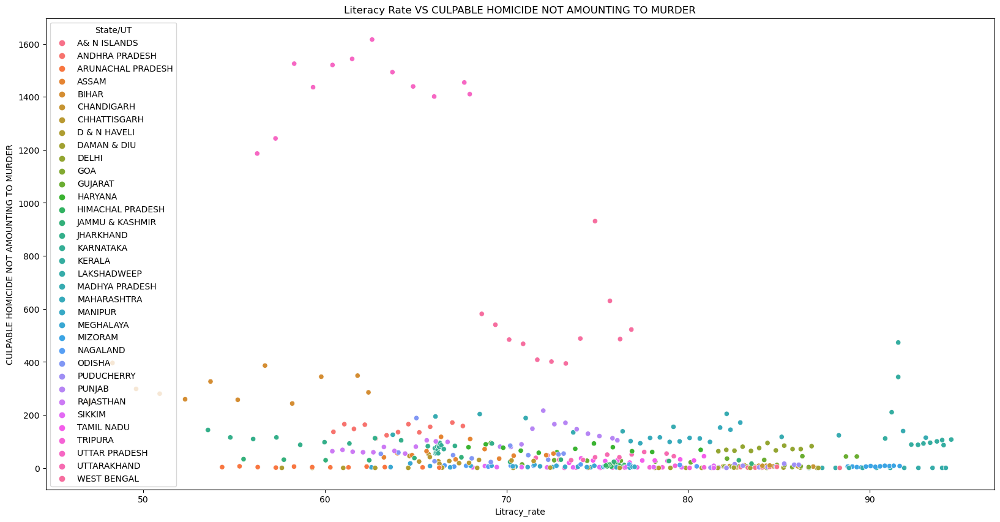

In [75]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', hue='State/UT', data=df)
plt.title('Literacy Rate VS CULPABLE HOMICIDE NOT AMOUNTING TO MURDER')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

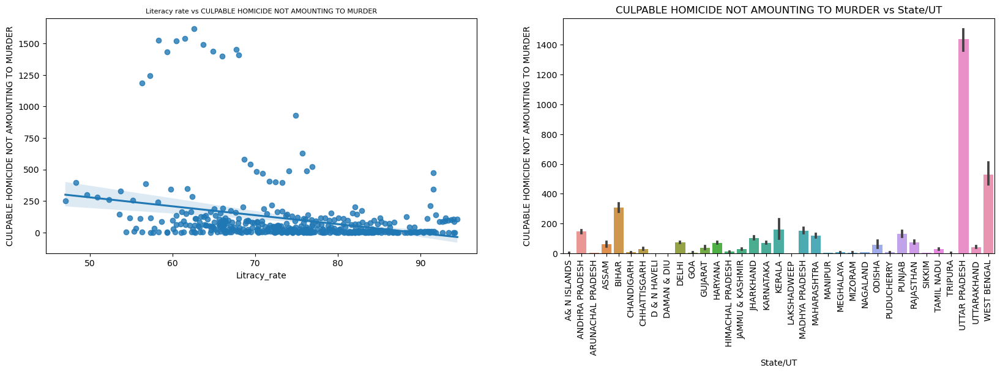

In [100]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CULPABLE HOMICIDE NOT AMOUNTING TO MURDER

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', data=df)
plt.title('Literacy rate vs CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', fontsize=8)

# CULPABLE HOMICIDE NOT AMOUNTING TO MURDER vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', data=df)
plt.title('CULPABLE HOMICIDE NOT AMOUNTING TO MURDER vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

With increasing the literacy rate the CULPABLE HOMICIDE NOT AMOUNTING TO MURDER cases decrease.

The state with the highest number of CULPABLE HOMICIDE NOT AMOUNTING TO MURDER cases is Uttar Pradesh, there is a significant difference between Uttar Pradesh and the rest of the states. West Bengal is second. 

### 4) Rape Cases Analysis

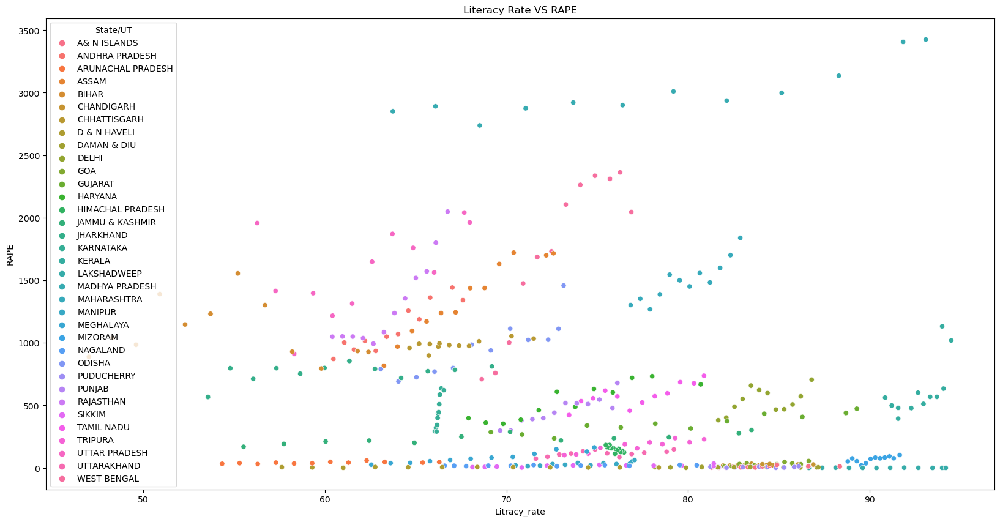

In [80]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='RAPE', hue='State/UT', data=df)
plt.title('Literacy Rate VS RAPE')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

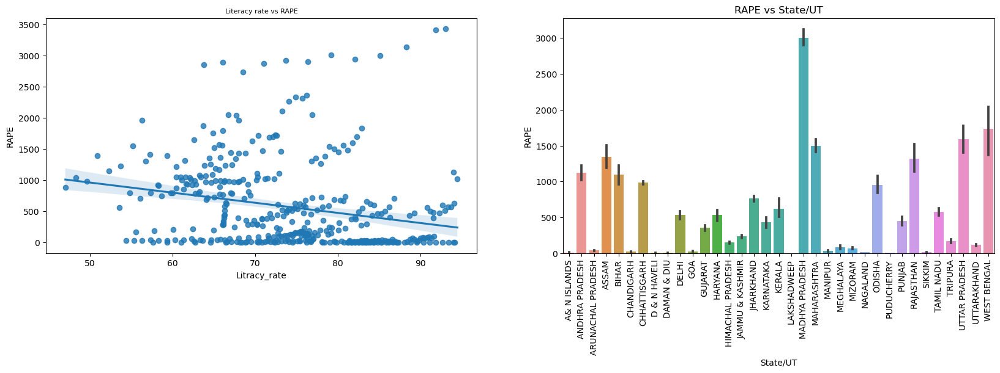

In [101]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs RAPE

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='RAPE', data=df)
plt.title('Literacy rate vs RAPE', fontsize=8)

# RAPE vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='RAPE', data=df)
plt.title('RAPE vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

With increasing the literacy rate the RAPE cases decrease.

Madhya Pradesh is the state with the highest number of reported rape cases. Second is west Bengal.

### 5) Custodial rape Cases Analysis

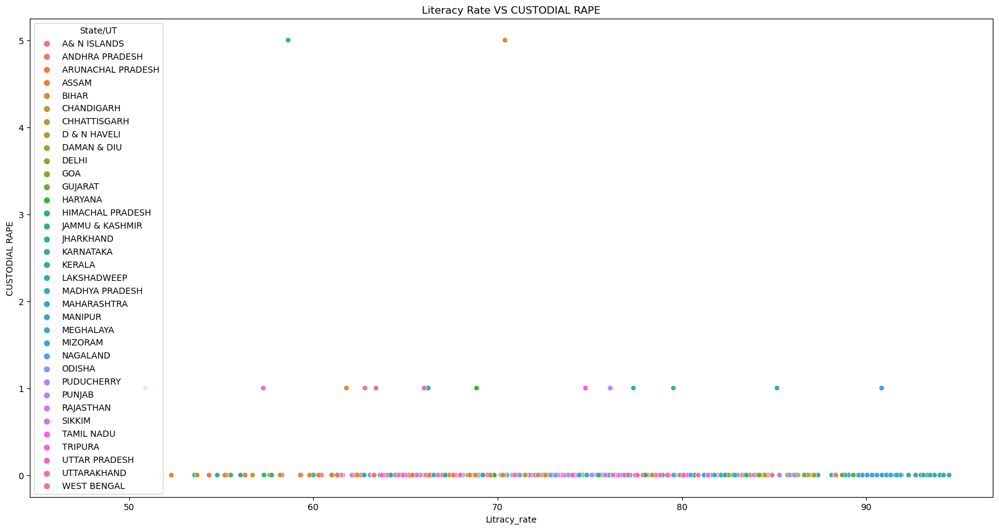

In [83]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CUSTODIAL RAPE', hue='State/UT', data=df)
plt.title('Literacy Rate VS CUSTODIAL RAPE')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

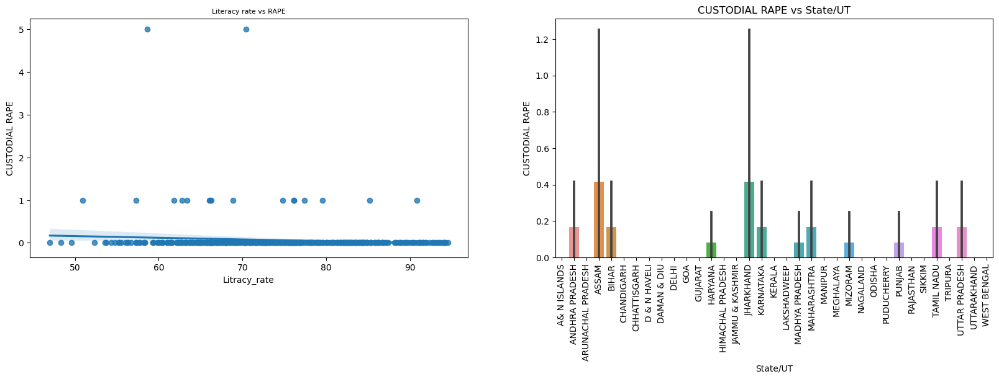

In [102]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CUSTODIAL RAPE

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CUSTODIAL RAPE', data=df)
plt.title('Literacy rate vs RAPE', fontsize=8)

# CUSTODIAL RAPE vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CUSTODIAL RAPE', data=df)
plt.title('CUSTODIAL RAPE vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

### 6) Other rape Cases Analysis

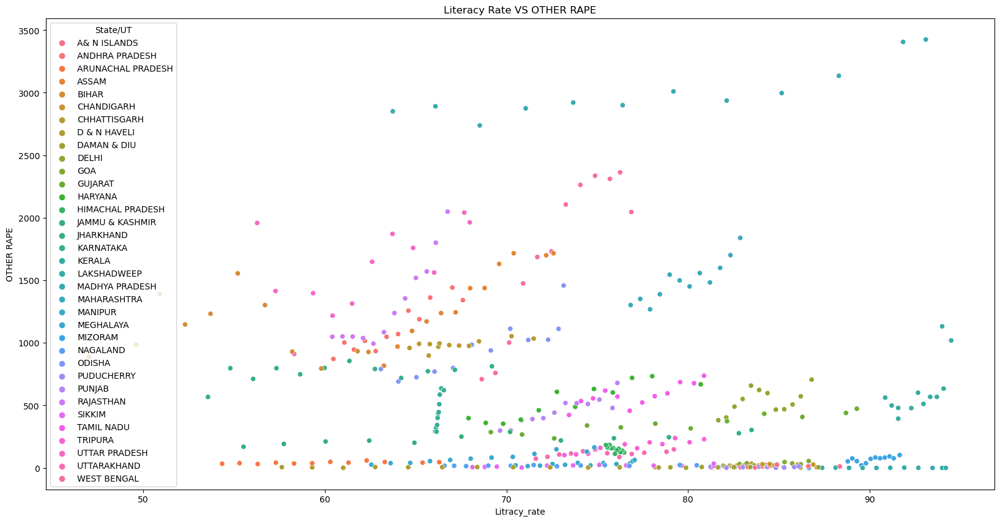

In [87]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='OTHER RAPE', hue='State/UT', data=df)
plt.title('Literacy Rate VS OTHER RAPE')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

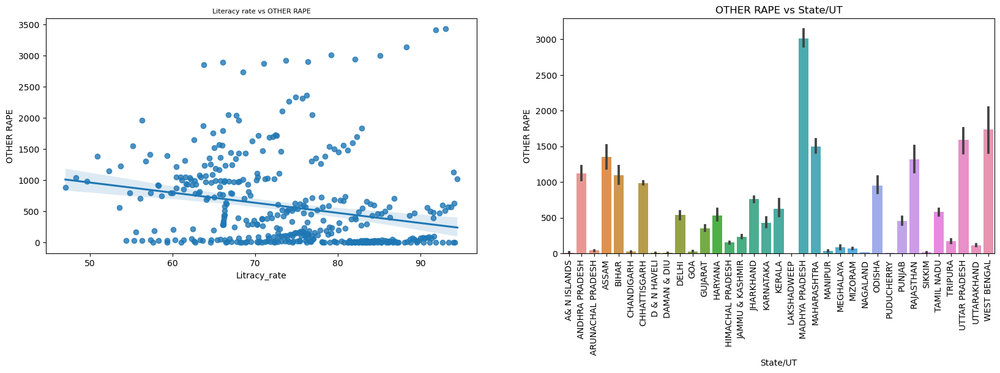

In [103]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs OTHER RAPE

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='OTHER RAPE', data=df)
plt.title('Literacy rate vs OTHER RAPE', fontsize=8)

# CUSTODIAL RAPE vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='OTHER RAPE', data=df)
plt.title('OTHER RAPE vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

With increasing the literacy rate the  OTHER RAPE cases decrease.

Madhya Pradesh is the state with the highest number of other rape cases.

### 7) Kidnapping and Abduction Cases Analysis

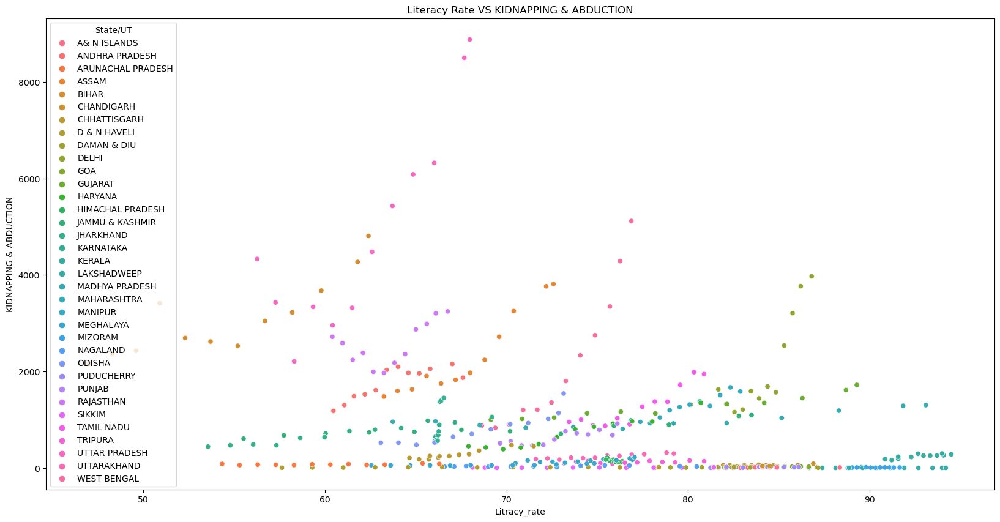

In [91]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='KIDNAPPING & ABDUCTION', hue='State/UT', data=df)
plt.title('Literacy Rate VS KIDNAPPING & ABDUCTION')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

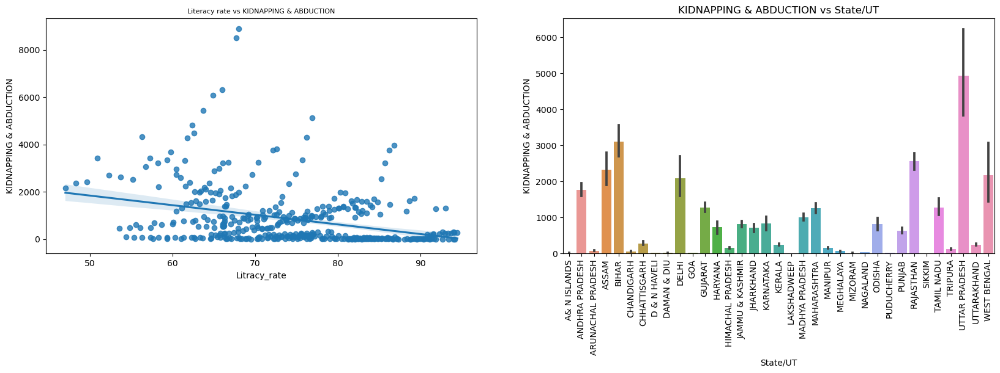

In [95]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs KIDNAPPING & ABDUCTION

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='KIDNAPPING & ABDUCTION', data=df)
plt.title('Literacy rate vs KIDNAPPING & ABDUCTION', fontsize=8)

# KIDNAPPING & ABDUCTION vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='KIDNAPPING & ABDUCTION', data=df)
plt.title('KIDNAPPING & ABDUCTION vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the KIDNAPPING & ABDUCTION cases decrease.
- Uttar Pradesh has the highest number of reported KIDNAPPING & ABDUCTION cases, second is Bihar.

### 8) Kidnapping and Abduction of women and girls Cases Analysis

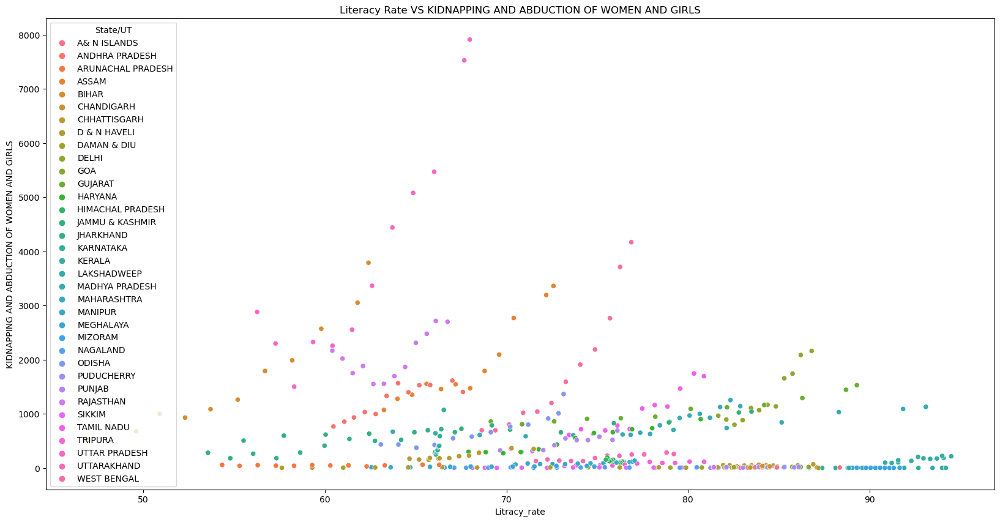

In [96]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', hue='State/UT', data=df)
plt.title('Literacy Rate VS KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

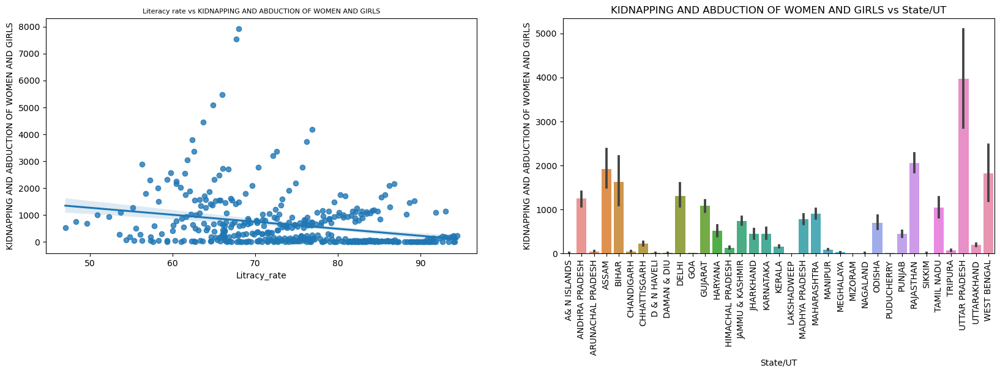

In [97]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', data=df)
plt.title('Literacy rate vs KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', fontsize=8)

# KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS', data=df)
plt.title('KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS cases decrease.
- Uttar Pradesh has the highest number of reported KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS cases.

### 9) Kidnapping and Abduction of Other Cases Analysis

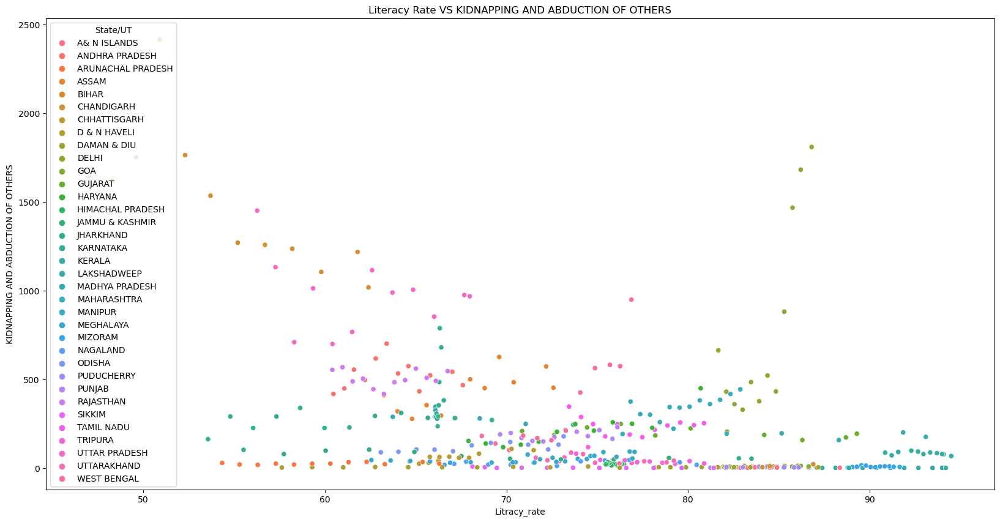

In [127]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='KIDNAPPING AND ABDUCTION OF OTHERS', hue='State/UT', data=df)
plt.title('Literacy Rate VS KIDNAPPING AND ABDUCTION OF OTHERS')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

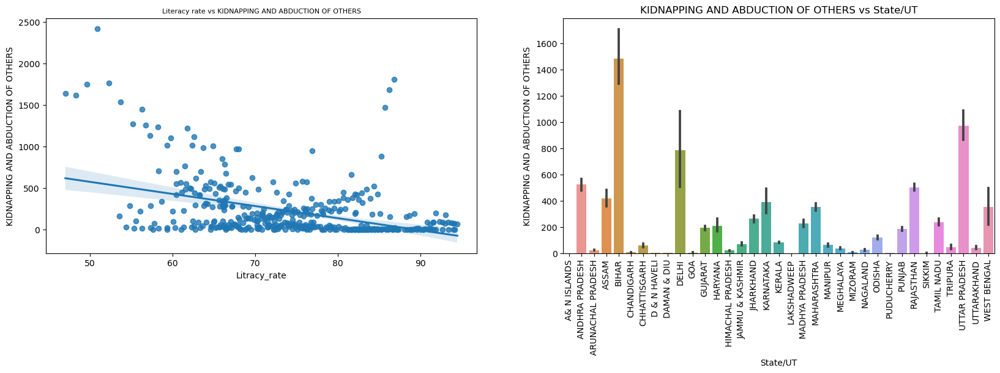

In [104]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs KIDNAPPING AND ABDUCTION OF OTHERS

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='KIDNAPPING AND ABDUCTION OF OTHERS', data=df)
plt.title('Literacy rate vs KIDNAPPING AND ABDUCTION OF OTHERS', fontsize=8)

# KIDNAPPING AND ABDUCTION OF OTHERS vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='KIDNAPPING AND ABDUCTION OF OTHERS', data=df)
plt.title('KIDNAPPING AND ABDUCTION OF OTHERS vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the KIDNAPPING AND ABDUCTION OF OTHERS cases decrease.
- Bihar has the highest number of reported KIDNAPPING AND ABDUCTION OF OTHERS cases. Uttar Pradesh is on second place, followed by Delhi.

### 10) Dacoity Cases Analysis

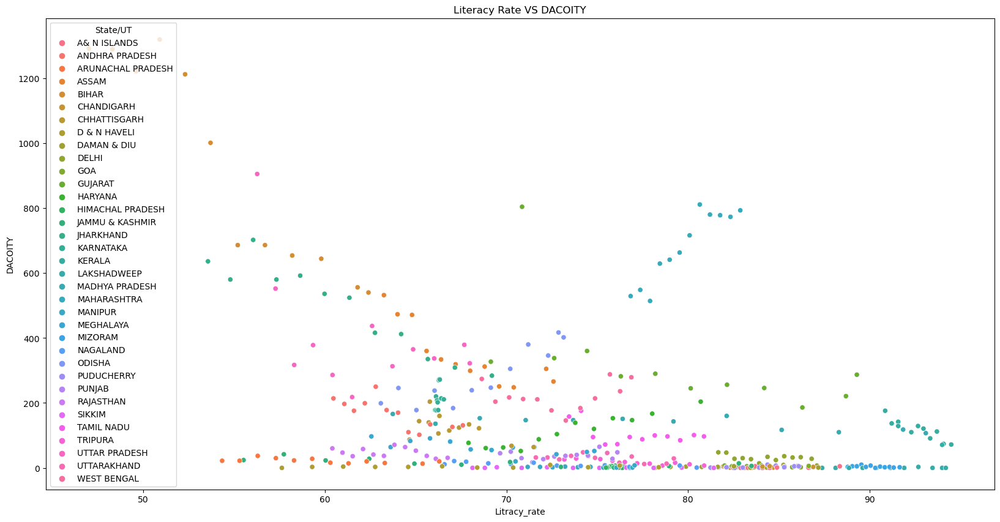

In [128]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='DACOITY', hue='State/UT', data=df)
plt.title('Literacy Rate VS DACOITY')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

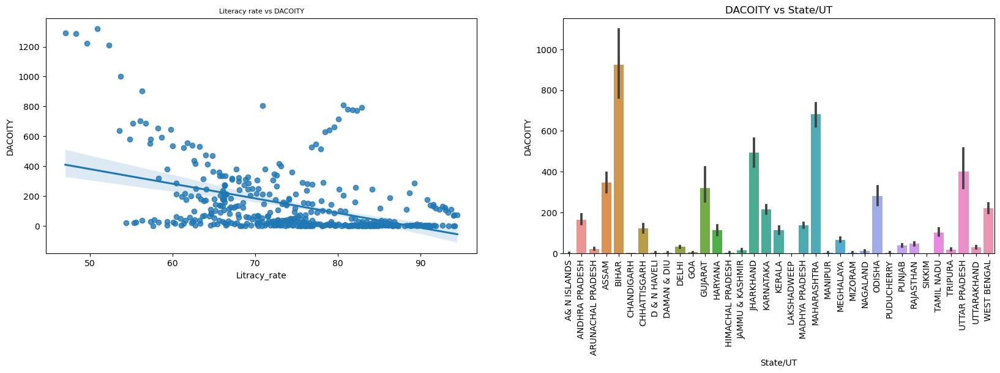

In [105]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs DACOITY

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='DACOITY', data=df)
plt.title('Literacy rate vs DACOITY', fontsize=8)

# DACOITY vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='DACOITY', data=df)
plt.title('DACOITY vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the DACOITY cases decrease.
- Bihar has the highest number of reported DACOITY cases. Maharashtra is on second place.

### 11) Preparation and Assembly for Dacoity Cases Analysis

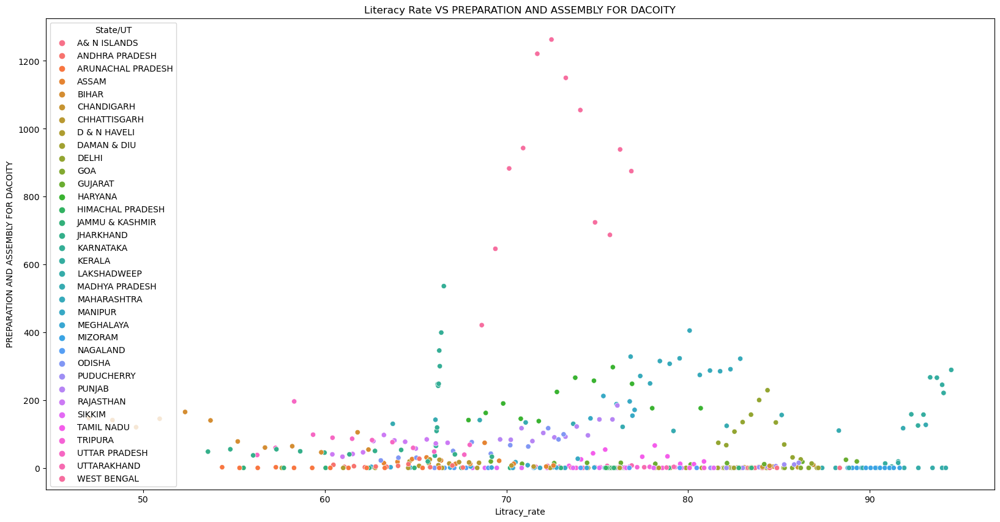

In [130]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='PREPARATION AND ASSEMBLY FOR DACOITY', hue='State/UT', data=df)
plt.title('Literacy Rate VS PREPARATION AND ASSEMBLY FOR DACOITY')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

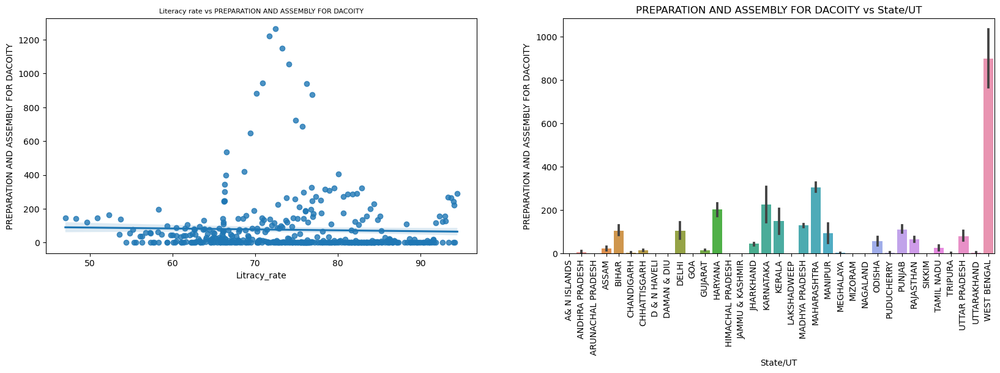

In [107]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs PREPARATION AND ASSEMBLY FOR DACOITY

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='PREPARATION AND ASSEMBLY FOR DACOITY', data=df)
plt.title('Literacy rate vs PREPARATION AND ASSEMBLY FOR DACOITY', fontsize=8)

# PREPARATION AND ASSEMBLY FOR DACOITY vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='PREPARATION AND ASSEMBLY FOR DACOITY', data=df)
plt.title('PREPARATION AND ASSEMBLY FOR DACOITY vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- The literacy rate stays pretty much consistant for these cases.
- West Bengal has the highest number of reported PREPARATION AND ASSEMBLY FOR DACOITY cases.

### 12) Robbery cases Analysis

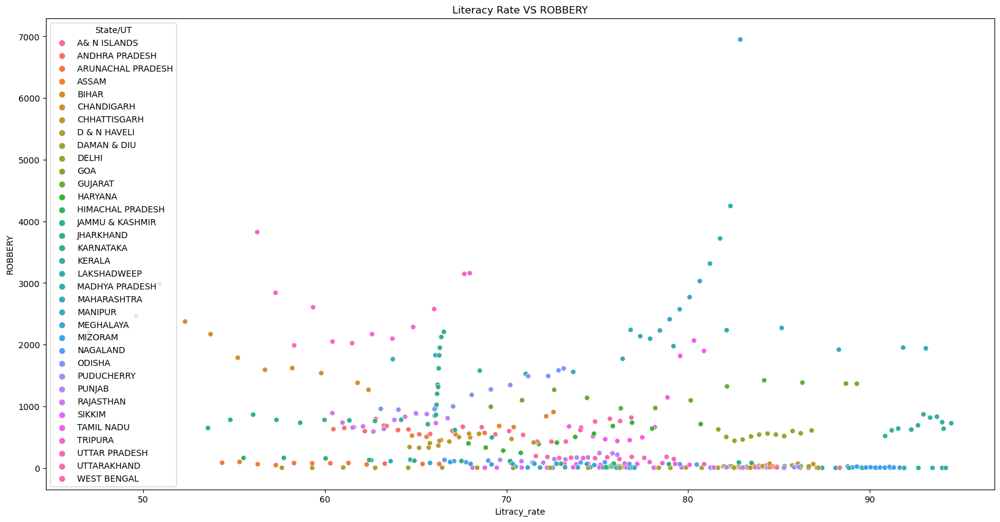

In [131]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='ROBBERY', hue='State/UT', data=df)
plt.title('Literacy Rate VS ROBBERY')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

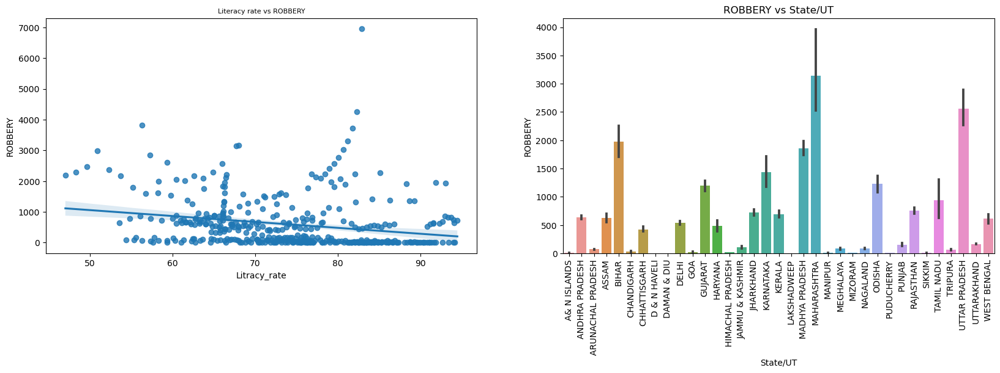

In [108]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs ROBBERY

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='ROBBERY', data=df)
plt.title('Literacy rate vs ROBBERY', fontsize=8)

# ROBBERY vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='ROBBERY', data=df)
plt.title('ROBBERY vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the ROBBERY cases decrease.
- Maharashtra has the highest number of reported ROBBERY cases. Uttar Pradesh is on second place.

### 13) Burglary Cases Analysis

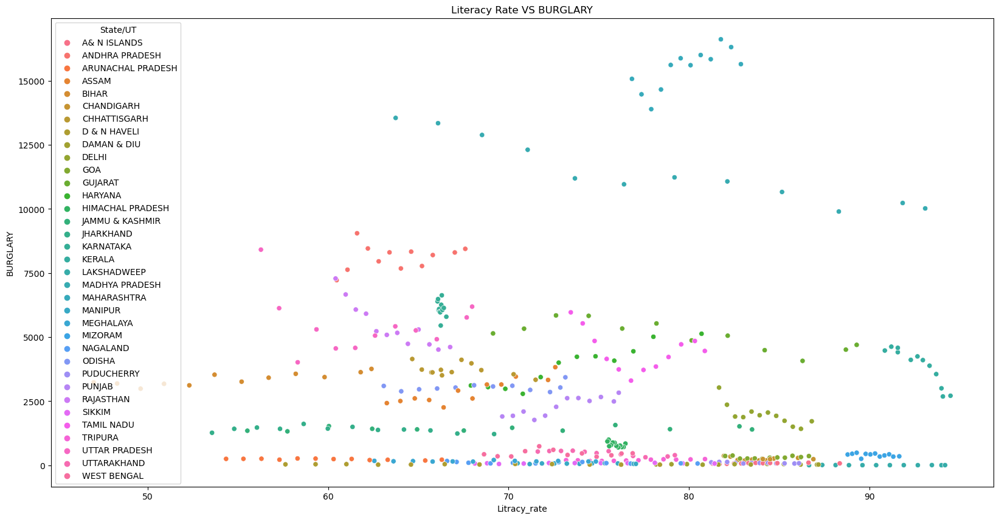

In [132]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='BURGLARY', hue='State/UT', data=df)
plt.title('Literacy Rate VS BURGLARY')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

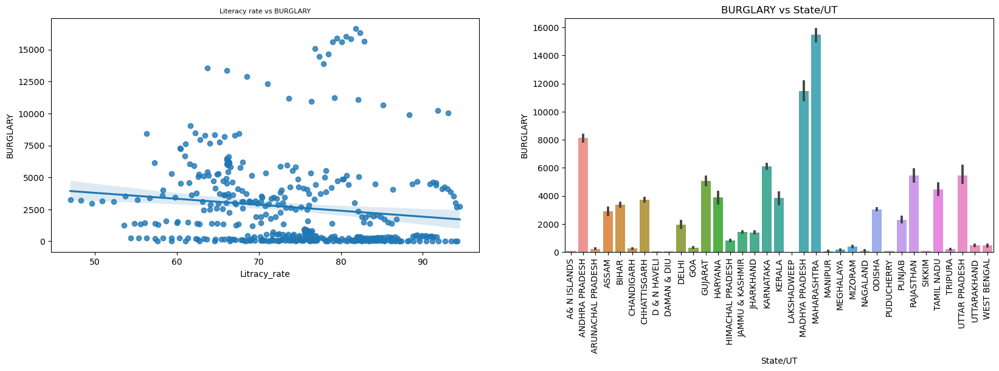

In [109]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs BURGLARY

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='BURGLARY', data=df)
plt.title('Literacy rate vs BURGLARY', fontsize=8)

# BURGLARY vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='BURGLARY', data=df)
plt.title('BURGLARY vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the BURGLARY cases decrease.
- Maharashtra has the highest number of reported BURGLARY cases. Madhya Pradesh is on second place.

### 14) Theft Cases Analysis

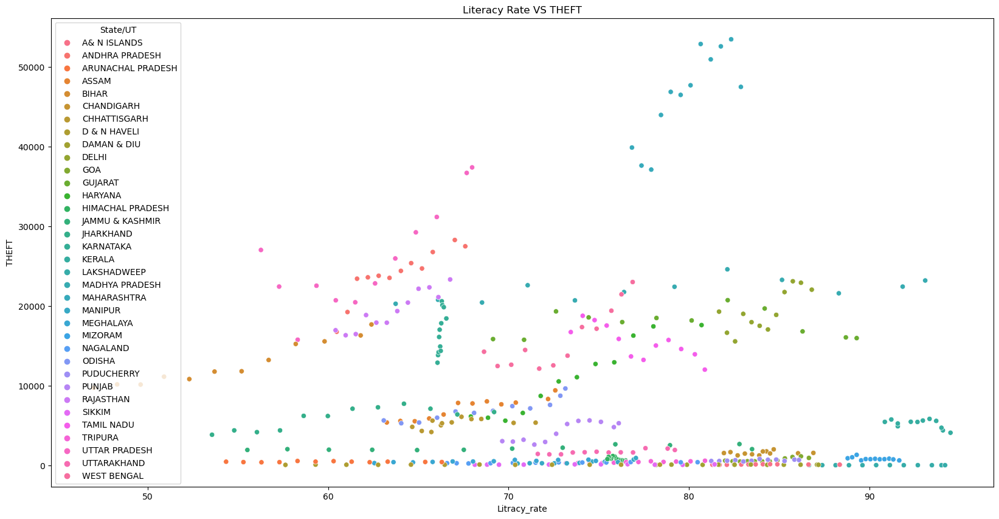

In [133]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='THEFT', hue='State/UT', data=df)
plt.title('Literacy Rate VS THEFT')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

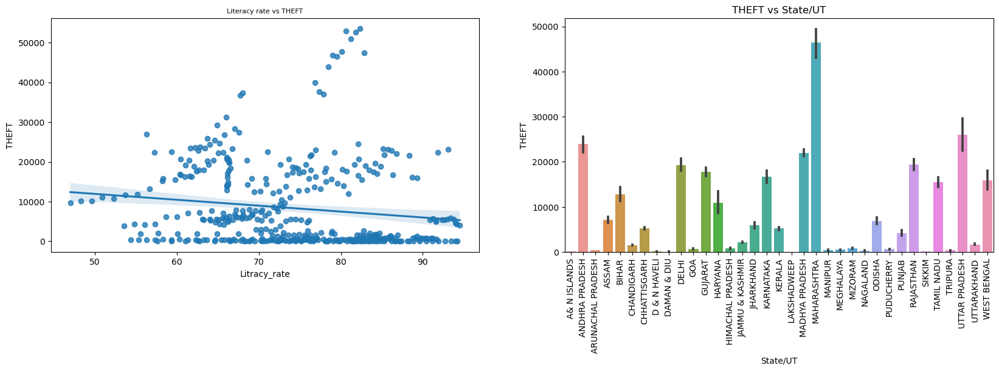

In [110]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs THEFT

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='THEFT', data=df)
plt.title('Literacy rate vs THEFT', fontsize=8)

# THEFT vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='THEFT', data=df)
plt.title('THEFT vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the THEFT cases decrease.
- Maharashtra has the highest number of reported THEFT cases.

### 15) Auto Theft Cases Analysis

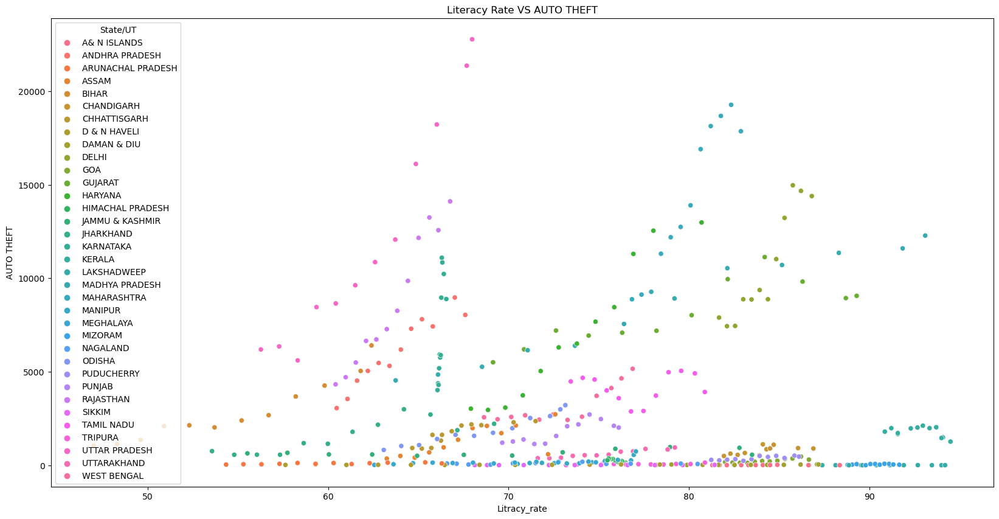

In [134]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='AUTO THEFT', hue='State/UT', data=df)
plt.title('Literacy Rate VS AUTO THEFT')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

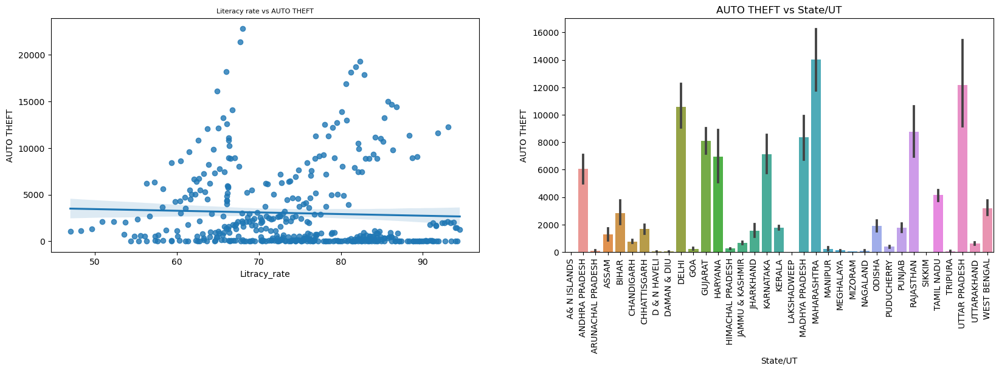

In [111]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs AUTO THEFT

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='AUTO THEFT', data=df)
plt.title('Literacy rate vs AUTO THEFT', fontsize=8)

# AUTO THEFT vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='AUTO THEFT', data=df)
plt.title('AUTO THEFT vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the AUTO THEFT cases slightly decreases.
- Maharashtra has the highest number of reported AUTO THEFT cases. Uttar Pradesh is on second place, followed by Delhi.

### 16) Other Theft cases Analysis

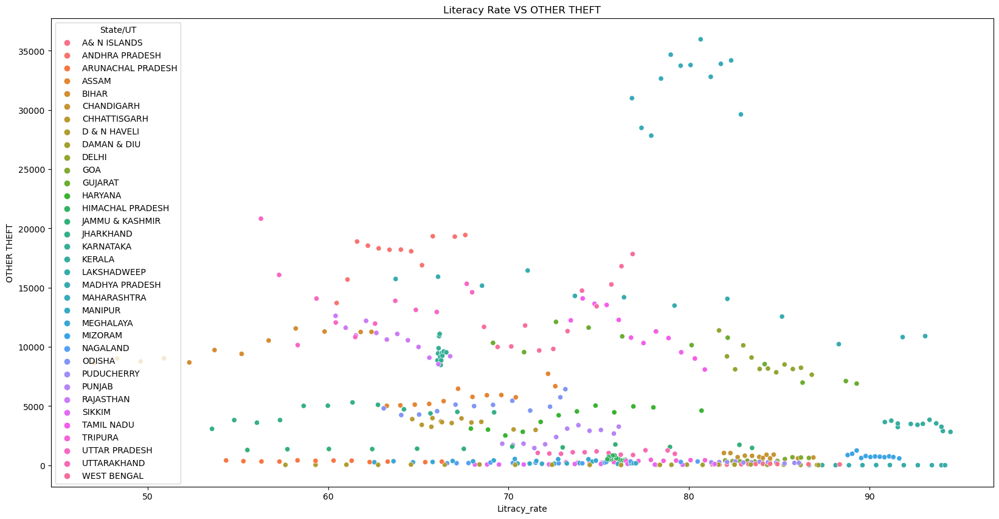

In [135]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='OTHER THEFT', hue='State/UT', data=df)
plt.title('Literacy Rate VS OTHER THEFT')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

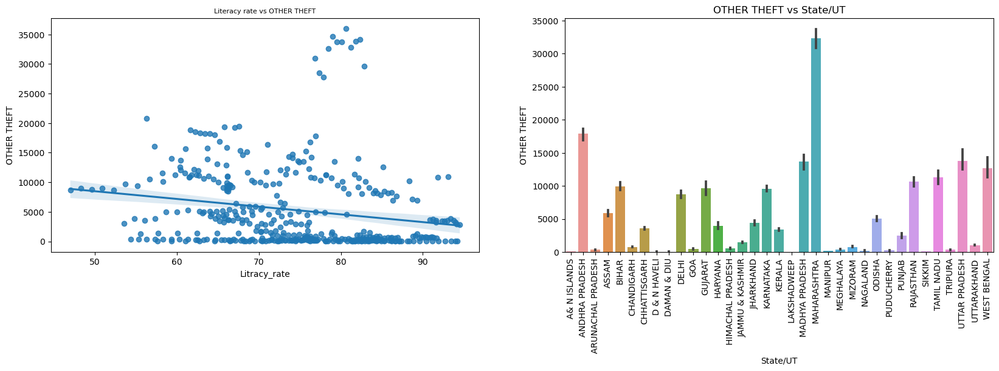

In [112]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs OTHER THEFT

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='OTHER THEFT', data=df)
plt.title('Literacy rate vs OTHER THEFT', fontsize=8)

# OTHER THEFT vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='OTHER THEFT', data=df)
plt.title('OTHER THEFT vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the OTHER THEFT cases decrease.
- Maharashtra has the highest number of reported OTHER THEFT cases. Andhra Pradesh is on second place.

### 17) Riots cases Analysis

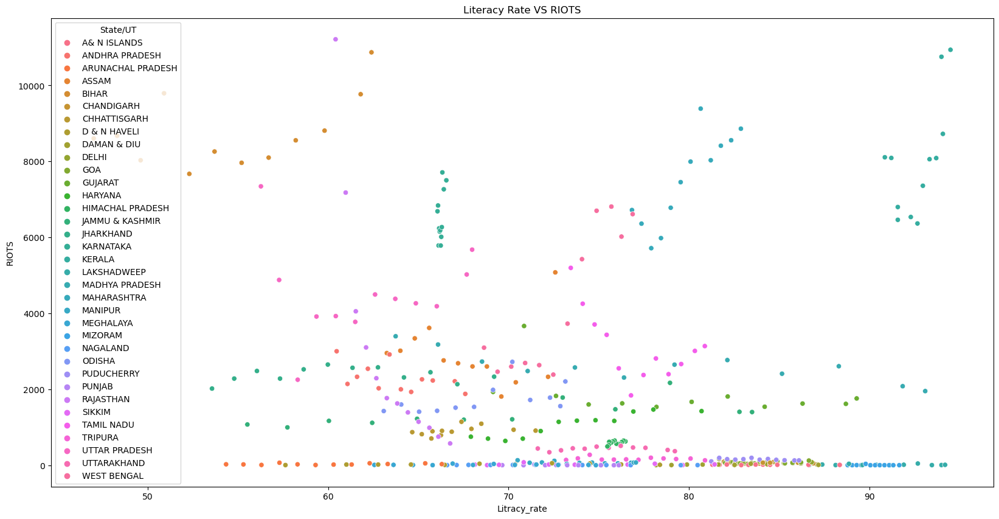

In [136]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='RIOTS', hue='State/UT', data=df)
plt.title('Literacy Rate VS RIOTS')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

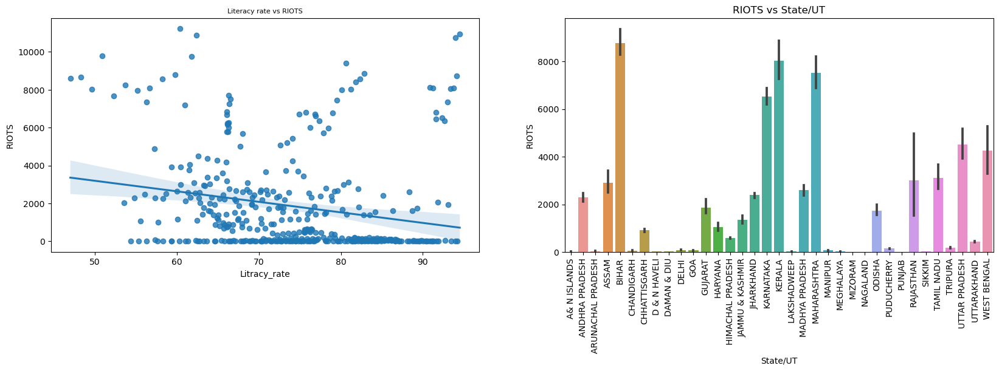

In [114]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs RIOTS

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='RIOTS', data=df)
plt.title('Literacy rate vs RIOTS', fontsize=8)

# RIOTHS vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='RIOTS', data=df)
plt.title('RIOTS vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the RIOTS cases decrease.
- Bihar has the highest number of reported RIOTS cases. Kerala is on second place, followed by Maharashtra.

### 18) Criminal Breach of Trust Cases Analysis

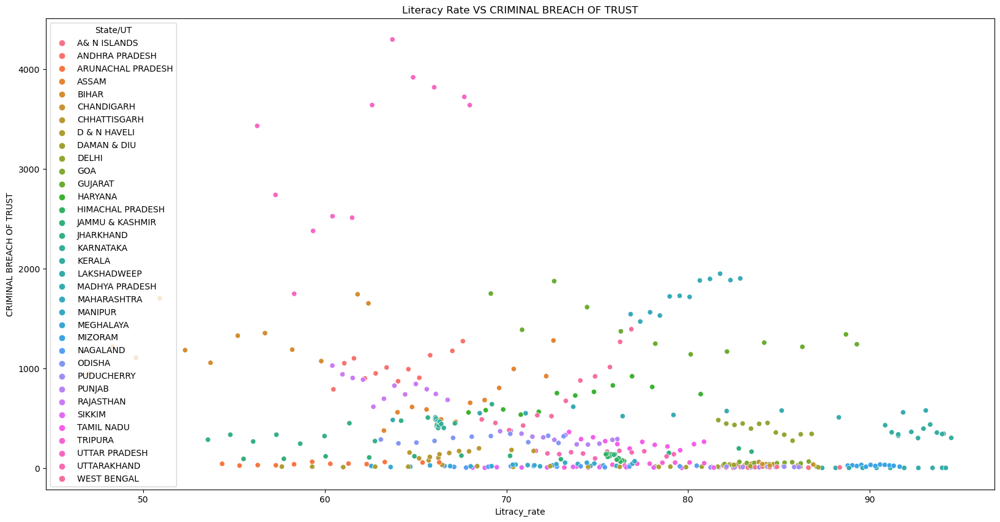

In [137]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CRIMINAL BREACH OF TRUST', hue='State/UT', data=df)
plt.title('Literacy Rate VS CRIMINAL BREACH OF TRUST')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

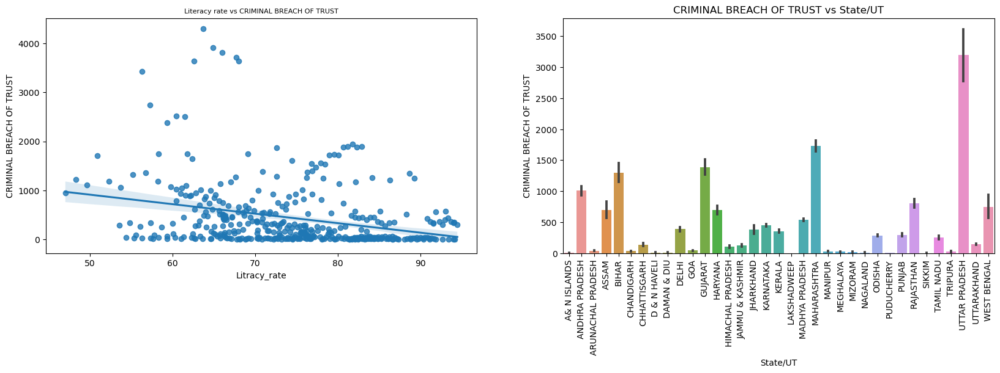

In [116]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CRIMINAL BREACH OF TRUST,

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CRIMINAL BREACH OF TRUST', data=df)
plt.title('Literacy rate vs CRIMINAL BREACH OF TRUST', fontsize=8)

# CRIMINAL BREACH OF TRUST vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CRIMINAL BREACH OF TRUST', data=df)
plt.title('CRIMINAL BREACH OF TRUST vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the CRIMINAL BREACH OF TRUST cases decrease.
- Uttar Pradesh has the highest number of reported CRIMINAL BREACH OF TRUST cases.

### 19) Cheating Cases Analysis

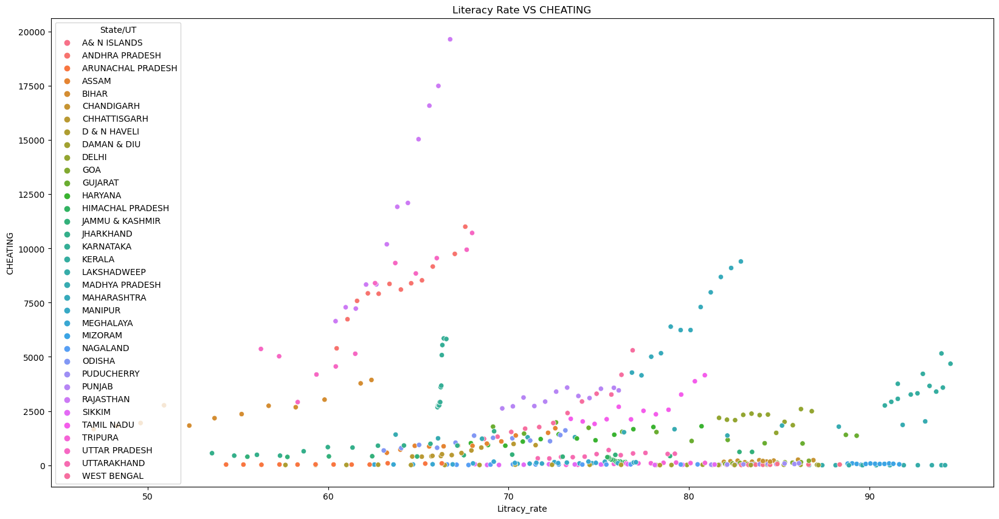

In [138]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CHEATING', hue='State/UT', data=df)
plt.title('Literacy Rate VS CHEATING')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

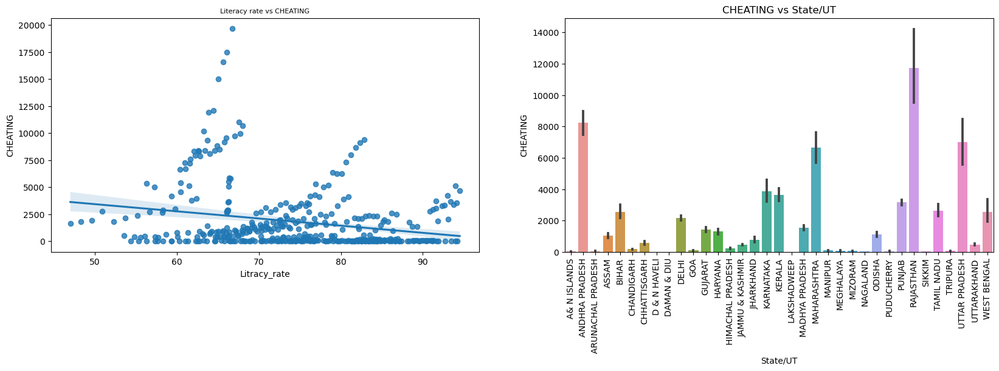

In [117]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CHEATING

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CHEATING', data=df)
plt.title('Literacy rate vs CHEATING', fontsize=8)

# CHEATING vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CHEATING', data=df)
plt.title('CHEATING vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the CRIMINAL BREACH OF TRUST cases decrease.
- Prajasthan has the highest number of reported CRIMINAL BREACH OF TRUST cases.

### 20) COUNTERFIETING Cases Analysis

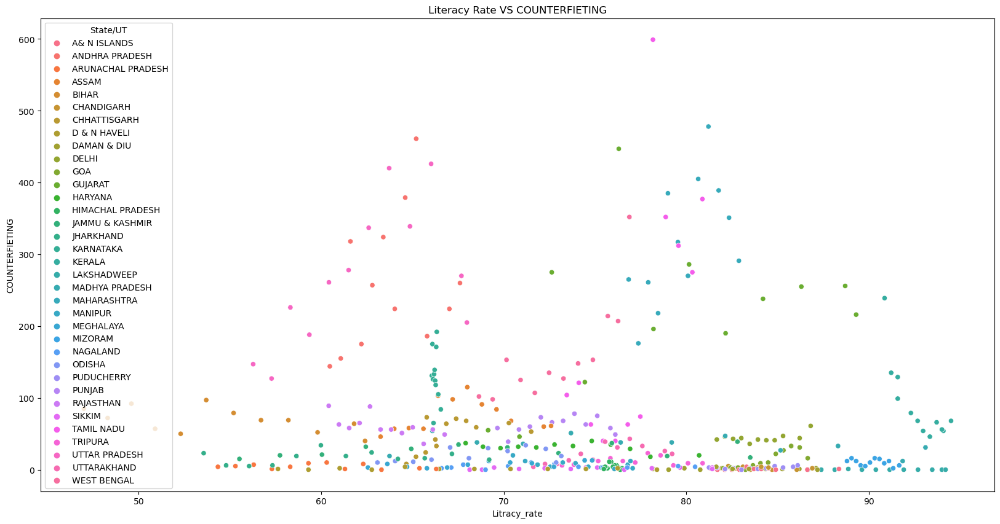

In [139]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='COUNTERFIETING', hue='State/UT', data=df)
plt.title('Literacy Rate VS COUNTERFIETING')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

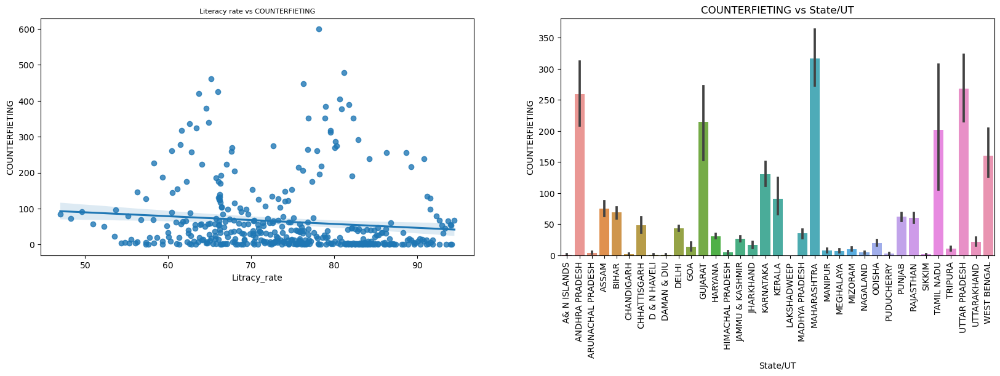

In [118]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs COUNTERFIETING

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='COUNTERFIETING', data=df)
plt.title('Literacy rate vs COUNTERFIETING', fontsize=8)

# COUNTERFIETING vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='COUNTERFIETING', data=df)
plt.title('COUNTERFIETING vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the COUNTERFIETING cases decrease.
- Maharashtra has the highest number of reported COUNTERFIETING cases.

### 21) Arson Cases Analysis

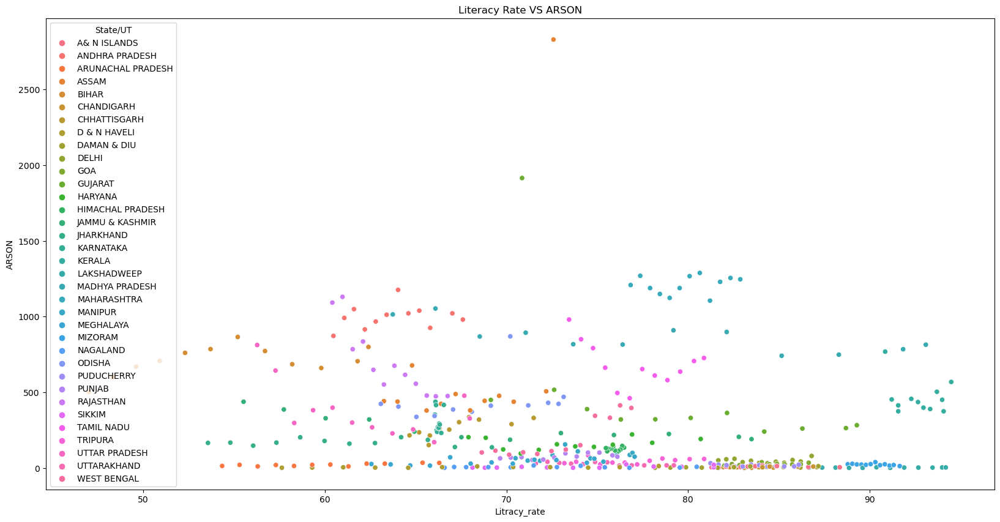

In [140]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='ARSON', hue='State/UT', data=df)
plt.title('Literacy Rate VS ARSON')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

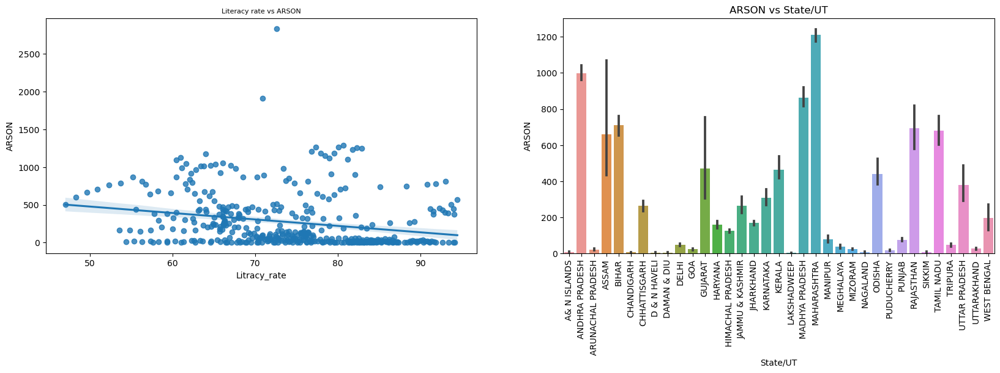

In [119]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs ARSON

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='ARSON', data=df)
plt.title('Literacy rate vs ARSON', fontsize=8)

# ARSON vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='ARSON', data=df)
plt.title('ARSON vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the ARSON cases decrease.
- Maharashtra has the highest number of reported ARSON cases.

### 22) Hurt/Grevious Hurt Cases Analysis

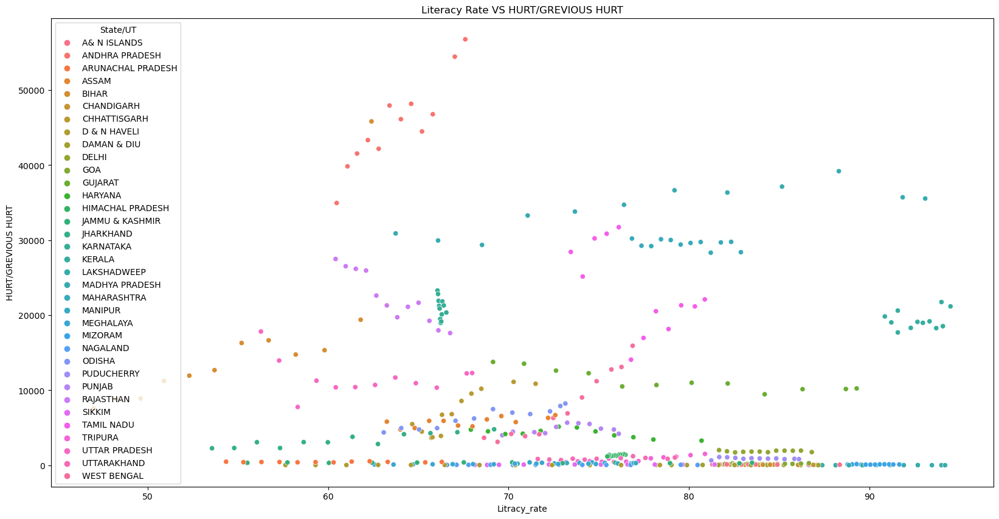

In [141]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='HURT/GREVIOUS HURT', hue='State/UT', data=df)
plt.title('Literacy Rate VS HURT/GREVIOUS HURT')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

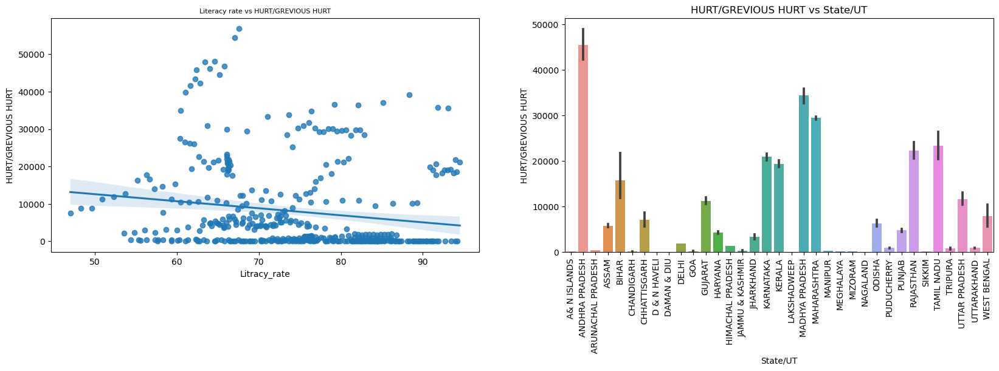

In [120]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs HURT/GREVIOUS HURT

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='HURT/GREVIOUS HURT', data=df)
plt.title('Literacy rate vs HURT/GREVIOUS HURT', fontsize=8)

# HURT/GREVIOUS HURT vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='HURT/GREVIOUS HURT', data=df)
plt.title('HURT/GREVIOUS HURT vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the HURT/GREVIOUS HURT cases decrease.
- Andhra Pradesh has the highest number of reported HURT/GREVIOUS HURT cases.

### 23) Dowry Deaths Cases Analysis

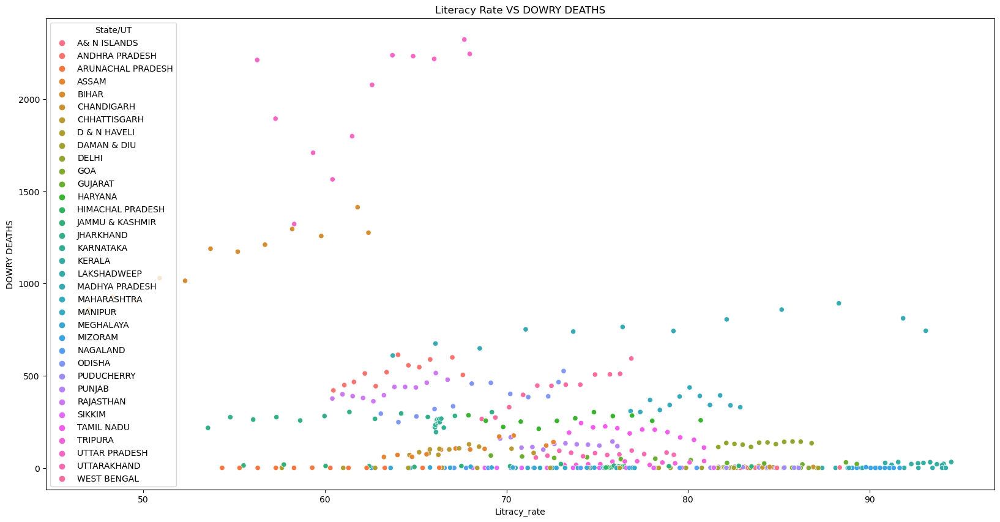

In [142]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='DOWRY DEATHS', hue='State/UT', data=df)
plt.title('Literacy Rate VS DOWRY DEATHS')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

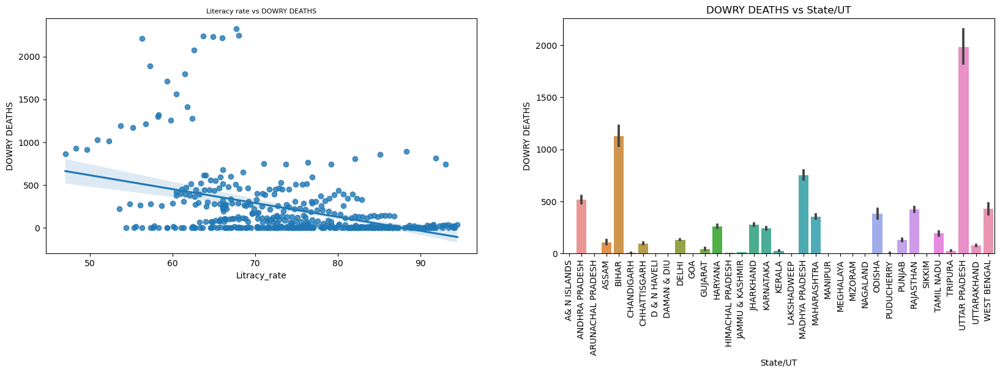

In [121]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs DOWRY DEATHS

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='DOWRY DEATHS', data=df)
plt.title('Literacy rate vs DOWRY DEATHS', fontsize=8)

# DOWRY DEATHS vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='DOWRY DEATHS', data=df)
plt.title('DOWRY DEATHS vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the DOWRY DEATHS cases decrease.
- Uttar Pradesh has the highest number of reported DOWRY DEATHS cases.

### 24) Assult on women with intent to outrage her modesty Cases Analysis

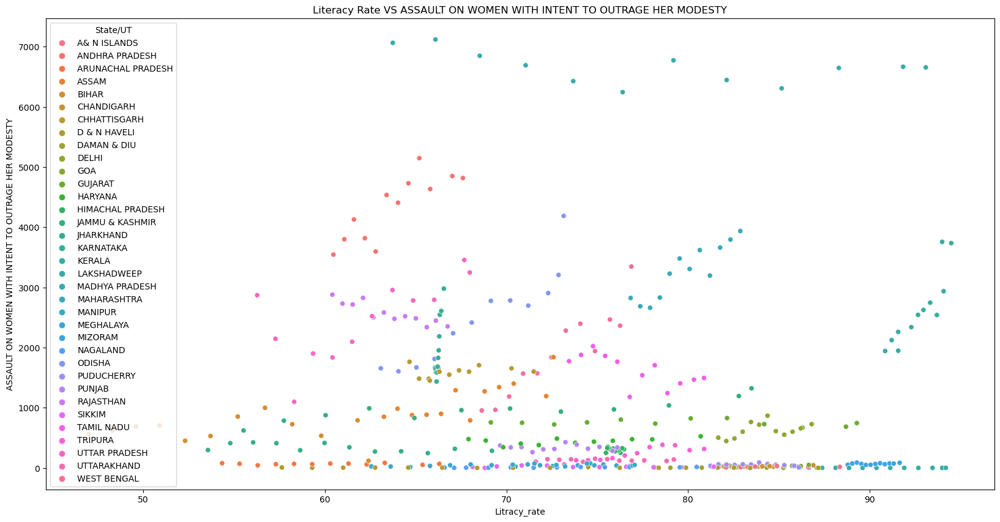

In [143]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', hue='State/UT', data=df)
plt.title('Literacy Rate VS ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

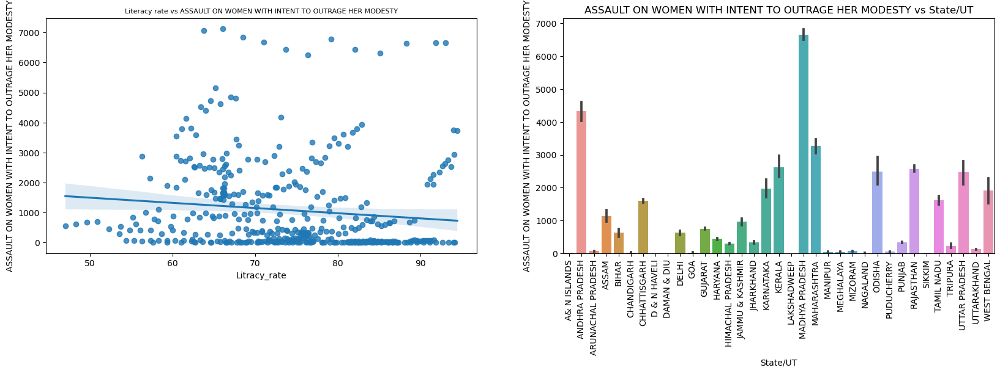

In [122]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', data=df)
plt.title('Literacy rate vs ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', fontsize=8)

# ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY', data=df)
plt.title('ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY cases decrease.
- Madhaya Pradesh has the highest number of reported ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY cases.

### 25) Insult to Modesty of Women Cases Analysis

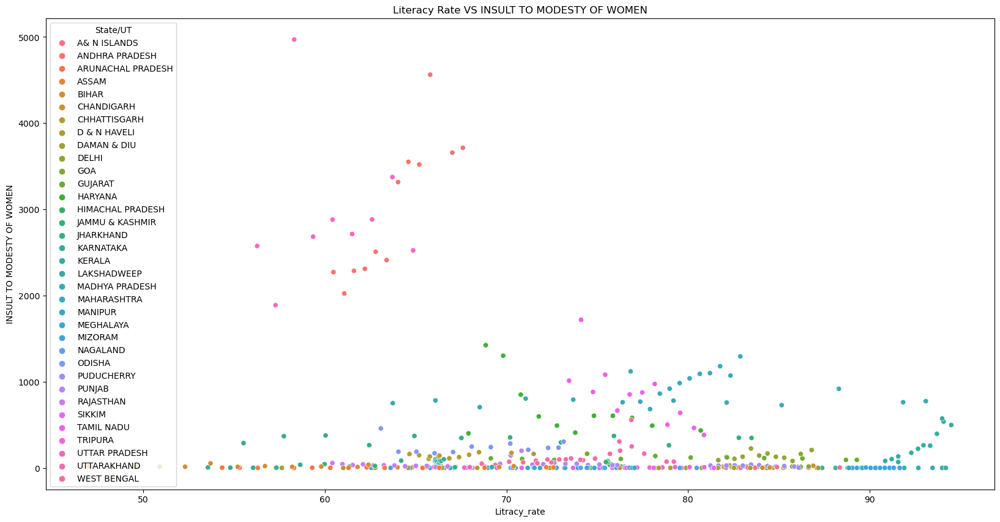

In [144]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='INSULT TO MODESTY OF WOMEN', hue='State/UT', data=df)
plt.title('Literacy Rate VS INSULT TO MODESTY OF WOMEN')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

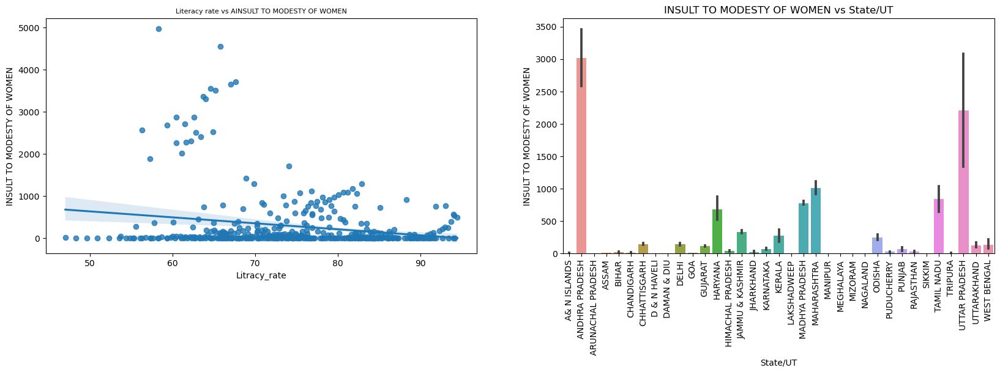

In [123]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs INSULT TO MODESTY OF WOMEN

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='INSULT TO MODESTY OF WOMEN', data=df)
plt.title('Literacy rate vs AINSULT TO MODESTY OF WOMEN', fontsize=8)

# INSULT TO MODESTY OF WOMEN vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='INSULT TO MODESTY OF WOMEN', data=df)
plt.title('INSULT TO MODESTY OF WOMEN vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the INSULT TO MODESTY OF WOMEN cases decrease.
- Andhra Pradesh has the highest number of reported INSULT TO MODESTY OF WOMEN cases.

### 26) Cruelty by Husband or his Relatives Cases Analysis

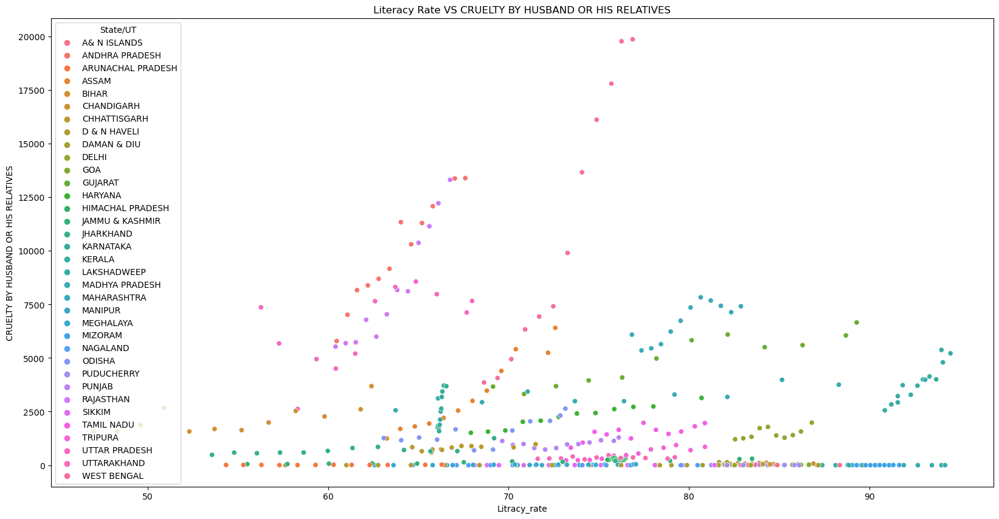

In [145]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CRUELTY BY HUSBAND OR HIS RELATIVES', hue='State/UT', data=df)
plt.title('Literacy Rate VS CRUELTY BY HUSBAND OR HIS RELATIVES')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

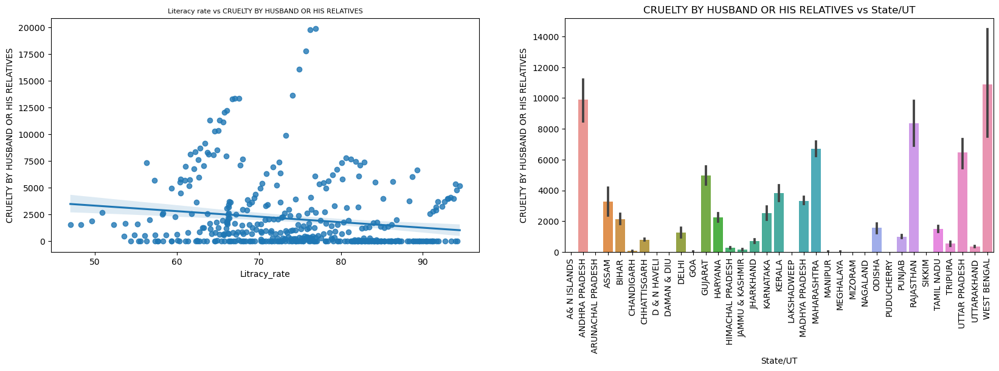

In [124]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CRUELTY BY HUSBAND OR HIS RELATIVES

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CRUELTY BY HUSBAND OR HIS RELATIVES', data=df)
plt.title('Literacy rate vs CRUELTY BY HUSBAND OR HIS RELATIVES', fontsize=8)

# CRUELTY BY HUSBAND OR HIS RELATIVES vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CRUELTY BY HUSBAND OR HIS RELATIVES', data=df)
plt.title('CRUELTY BY HUSBAND OR HIS RELATIVES vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the CRUELTY BY HUSBAND OR HIS RELATIVES cases decrease.
- West Bengal has the highest number of reported CRUELTY BY HUSBAND OR HIS RELATIVES cases, followed by Andhra Pradesh

### 27) Importation of Girls from a Foreign Countries cases Analysis

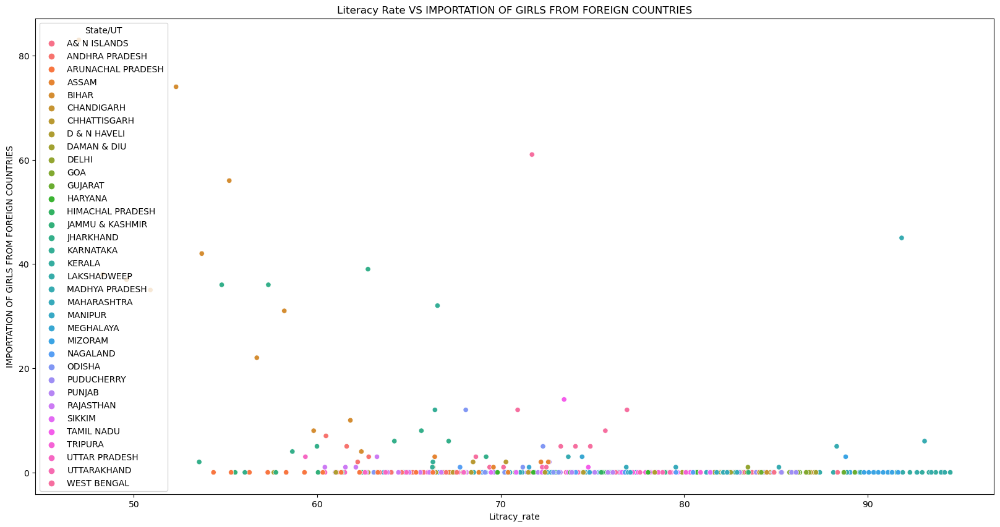

In [146]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', hue='State/UT', data=df)
plt.title('Literacy Rate VS IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

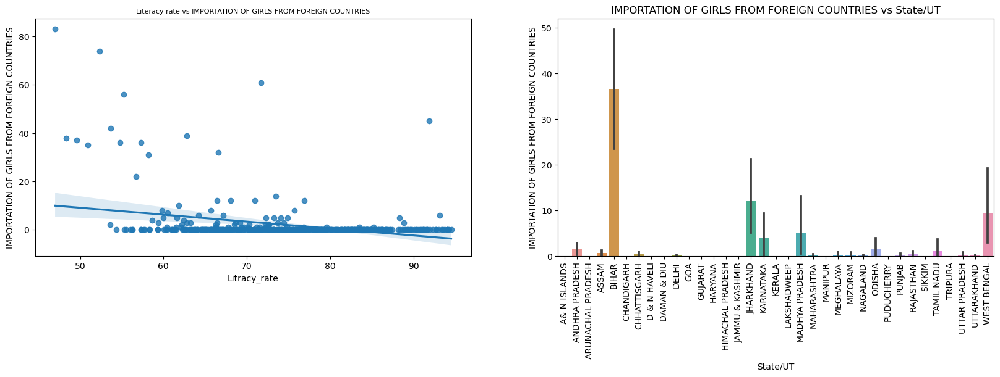

In [125]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', data=df)
plt.title('Literacy rate vs IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', fontsize=8)

# IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES', data=df)
plt.title('IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES cases decrease.
- Bihar has significantly high number of reported IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES cases compared with the rest of the states.

### 28) Causing death by Negligence Cases Analysis

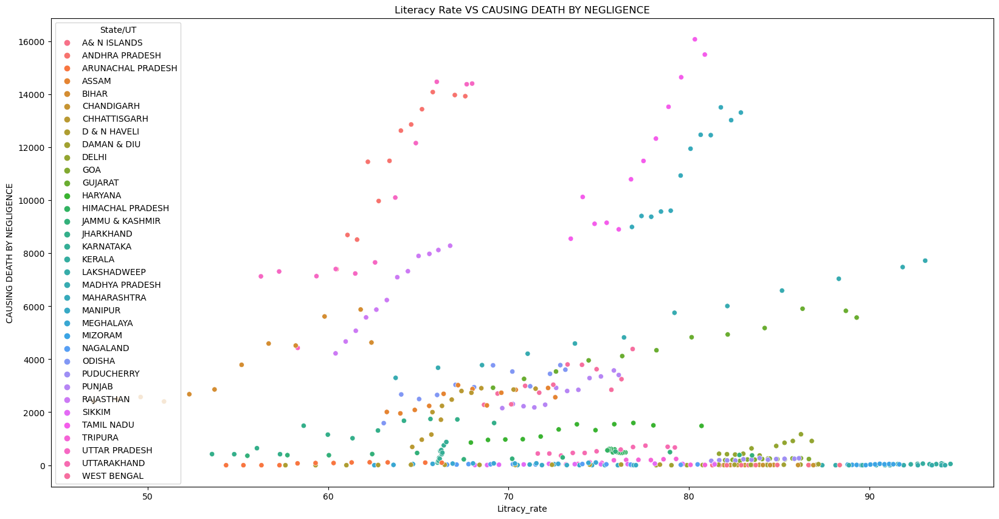

In [147]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Litracy_rate', y='CAUSING DEATH BY NEGLIGENCE', hue='State/UT', data=df)
plt.title('Literacy Rate VS CAUSING DEATH BY NEGLIGENCE')

plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

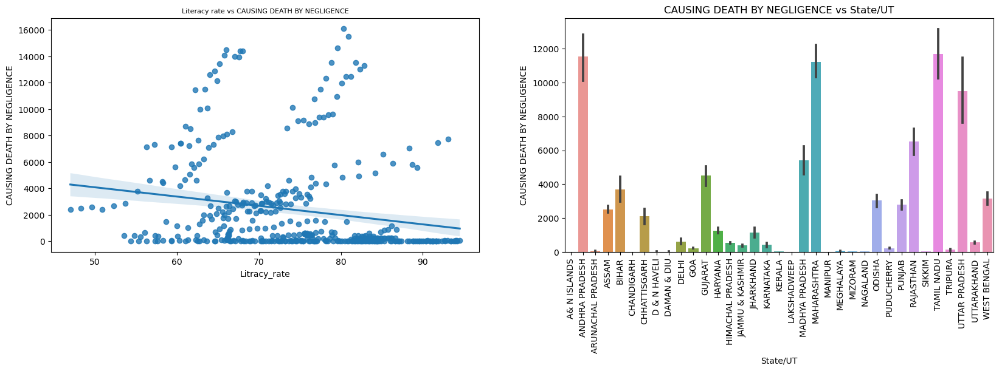

In [126]:
plt.figure(figsize=(20,5), facecolor='white')

# Literacy rate vs CAUSING DEATH BY NEGLIGENCE

plt.subplot(1,2,1)
sns.regplot(x='Litracy_rate', y='CAUSING DEATH BY NEGLIGENCE', data=df)
plt.title('Literacy rate vs CAUSING DEATH BY NEGLIGENCE', fontsize=8)

# CAUSING DEATH BY NEGLIGENCE vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='CAUSING DEATH BY NEGLIGENCE', data=df)
plt.title('CAUSING DEATH BY NEGLIGENCE vs State/UT')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the literacy rate the CAUSING DEATH BY NEGLIGENCE cases decrease.
- Andhra Pradesh and Tamil Nadu have the highest number of reported CAUSING DEATH BY NEGLIGENCE cases.

### Observation:

- By analysing all types of crimes, we have noticed that with incresing the crimes count, the Literacy Rate decreases. That is in all type of crimes appart from the Preparation and Assembly for Dacoity Cases, where the literacy rate stays pretty much consistant.

- Andhara Pradesh, Bihar, Maharashtra and Uttar Pardesh have very high number of all types of reported crimes.

## 2.3	Analysis of year-on-year total crime rate

<function matplotlib.pyplot.show(close=None, block=None)>

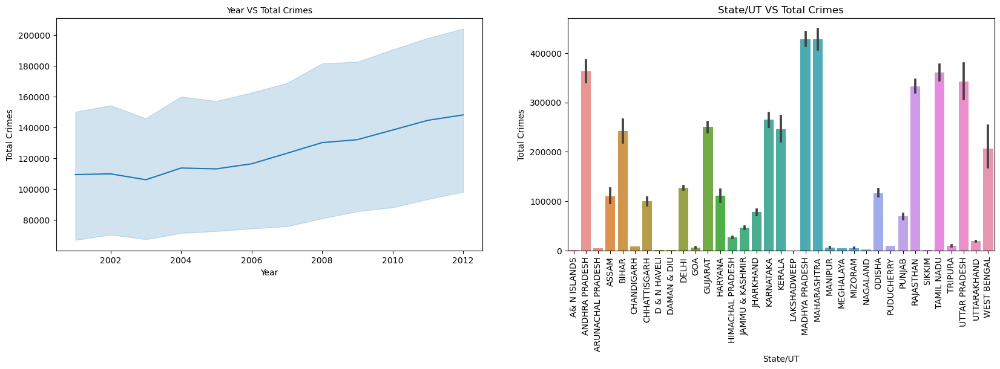

In [153]:
plt.figure(figsize=(20,5), facecolor='white')

# Year vs Total Crimes

plt.subplot(1,2,1)
sns.lineplot(x='Year', y='Total Crimes', data=df)
plt.title('Year VS Total Crimes', fontsize=10)

# Total Crimes vs State/UT

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='Total Crimes', data=df)
plt.title('State/UT VS Total Crimes')
plt.xticks(rotation=90, fontsize=10)

plt.show

- With increasing the Year the number of the Total Crime Cases increses too.
- Madhaya Pradesh and Maharashtra have the highest number of reported crime cases.

<function matplotlib.pyplot.show(close=None, block=None)>

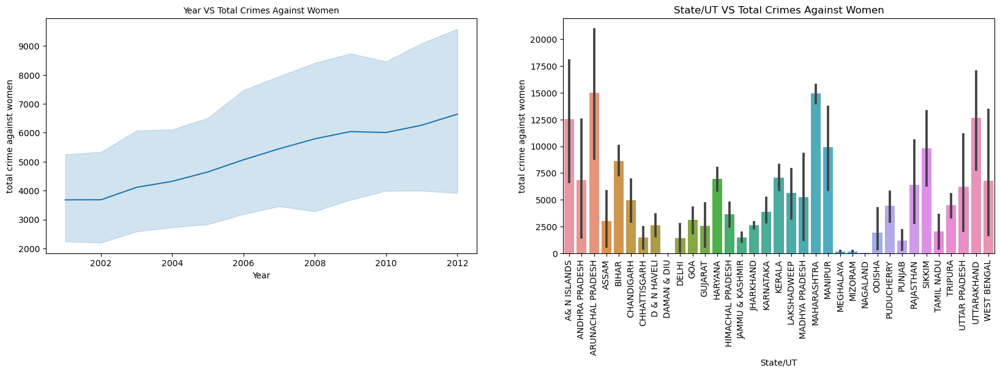

In [154]:
plt.figure(figsize=(20,5), facecolor='white')

# Year vs Total Crimes Against Women

plt.subplot(1,2,1)
sns.lineplot(x='Year', y='total crime against women', data=df)
plt.title('Year VS Total Crimes Against Women', fontsize=10)

# State/UT VS Total Crimes Against Women

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='total crime against women', data=df)
plt.title('State/UT VS Total Crimes Against Women')
plt.xticks(rotation=90, fontsize=10)

plt.show

- The total amount of crimes against women has significantly increased with the years.
- Arunachal Pradesh and Maharashtra have the highest number of crime cases reported against women.

<function matplotlib.pyplot.show(close=None, block=None)>

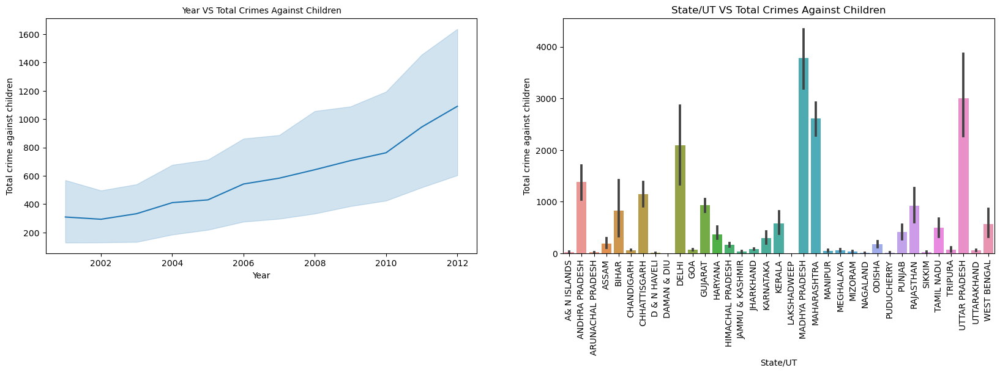

In [156]:
plt.figure(figsize=(20,5), facecolor='white')

# Year vs Total Crimes Against Choldren

plt.subplot(1,2,1)
sns.lineplot(x='Year', y='Total crime against children', data=df)
plt.title('Year VS Total Crimes Against Children', fontsize=10)

# State/UT VS Total Crimes Against Children

plt.subplot(1,2,2)
sns.barplot(x='State/UT', y='Total crime against children', data=df)
plt.title('State/UT VS Total Crimes Against Children')
plt.xticks(rotation=90, fontsize=10)

plt.show

- The total amount of crime cases against children significantly increases over the years.
- Madhaya Pradesh has the highest number of reported crimes against children. followed by Utter Pradesh and Maharashtra.

## 2.4	 Analysis of area vs overall crime

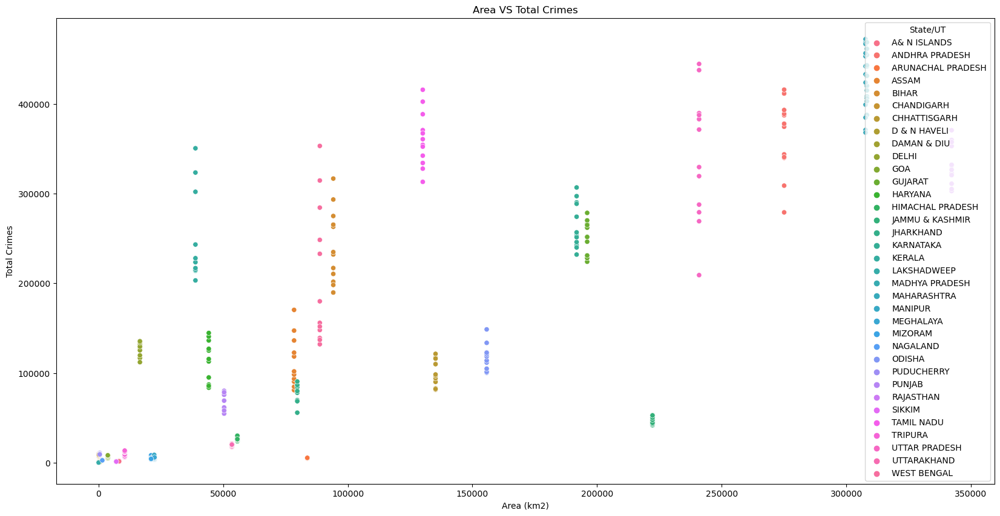

In [166]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='Area (km2)', y='Total Crimes', hue='State/UT', data=df)
plt.title('Area VS Total Crimes')

plt.show()

Text(0.5, 1.0, 'Area (km2) VS Total Crimes')

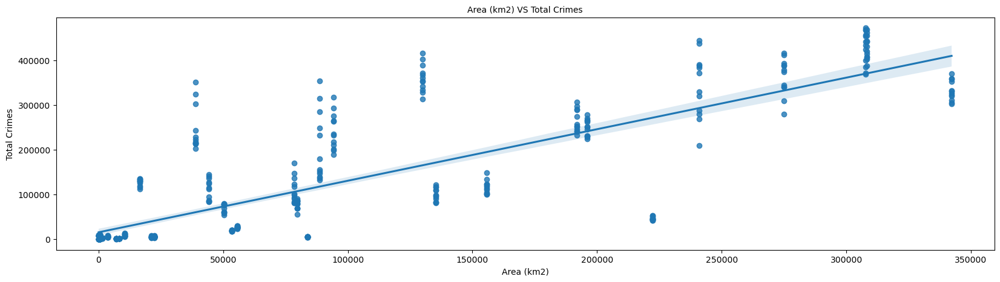

In [175]:
plt.figure(figsize=(20,5), facecolor='white')

# Area vs Total Crimes

sns.regplot(x='Area (km2)', y='Total Crimes', data=df)
plt.title('Area (km2) VS Total Crimes', fontsize=10)

In [179]:
df.groupby('Area (km2)')['Total Crimes'].sum().sort_values(ascending = False).to_frame()

,Total Crimes
Area (km2),
308245,5139445
307713,5136766
275045,4359870
130058,4327767
240928,4106519
342239,3991331
191791,3177289
196024,3004252
38863,2947609


## 2.5	 Analysis of Population vs overall Crime

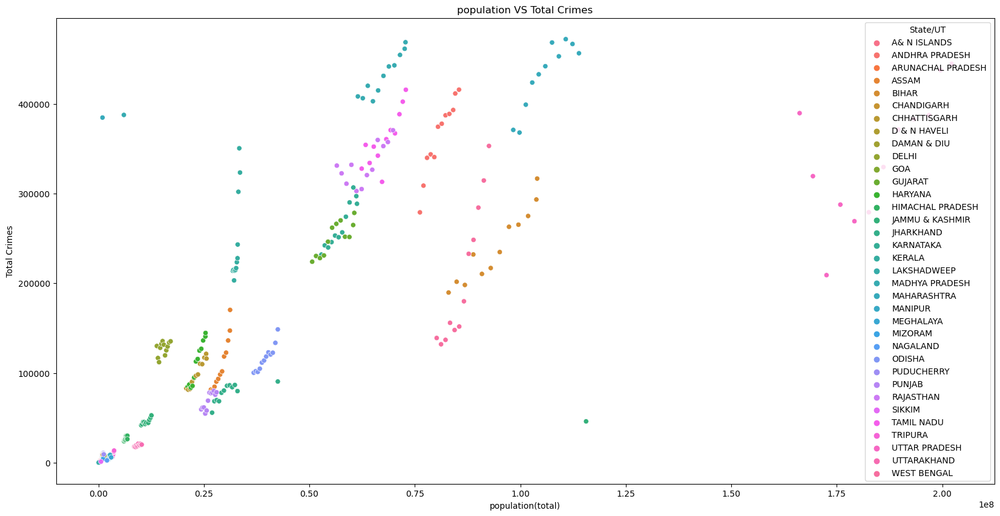

In [172]:
plt.figure(figsize=(20,10))

sns.scatterplot(x='population(total)', y='Total Crimes', hue='State/UT', data=df)
plt.title('population VS Total Crimes')

plt.show()

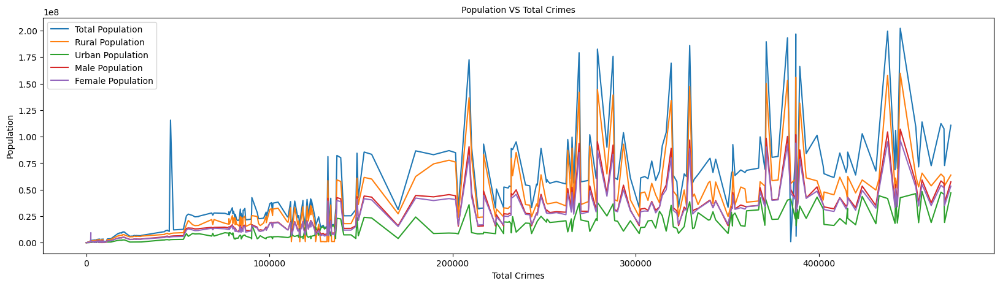

In [176]:
plt.figure(figsize=(20,5), facecolor='white')

# Population vs Total Crimes
# Rural vs Total Crimes
# Urban vs Total Crimes
# Male population vs Total Crimes
# Female population vs Total Crimes


sns.lineplot(x='Total Crimes', y='population(total)', data=df, label='Total Population')
sns.lineplot(x='Total Crimes', y='Rural', data=df, label='Rural Population')
sns.lineplot(x='Total Crimes', y='Urban', data=df, label='Urban Population')
sns.lineplot(x='Total Crimes', y='Tot_Male', data=df, label='Male Population')
sns.lineplot(x='Total Crimes', y='Tot_Female', data=df, label='Female Population')

plt.title('Population VS Total Crimes', fontsize=10)
plt.xlabel('Total Crimes')
plt.ylabel('Population')

plt.legend()
plt.show()

The number of crimes increases with population increse.

## 2.6	Each state crime report

In [189]:
df.groupby('State/UT')['Total Crimes'].sum().sort_values(ascending = False).to_frame()

,Total Crimes
State/UT,
MADHYA PRADESH,5139445
MAHARASHTRA,5136766
ANDHRA PRADESH,4359870
TAMIL NADU,4327767
UTTAR PRADESH,4106519
RAJASTHAN,3991331
KARNATAKA,3177289
GUJARAT,3004252
KERALA,2947609


- MADHYA PRADESH, MAHARASHTRA, ANDHRA PRADESH, TAMIL NADU, UTTAR PRADESH are the top 5 states with the highest number of reported Total Crimes, over 4 million reported cases.
- A& N ISLANDS, SIKKIM, D & N HAVELI, DAMAN & DIU, LAKSHADWEEP are the 5 states with the lowest number of reported Total Crime cases, less than 20 thousands reported cases.

In [190]:
df.groupby('State/UT')['total crime against women'].sum().sort_values(ascending = False).to_frame()

,total crime against women
State/UT,
ARUNACHAL PRADESH,179664.00000
MAHARASHTRA,179567.00000
UTTARAKHAND,151680.29927
A& N ISLANDS,150845.00000
MANIPUR,119307.00000
SIKKIM,117542.29927
BIHAR,103606.00000
KERALA,84630.00000
HARYANA,83510.00000


- ARUNACHAL PRADESH, MAHARASHTRA, UTTARAKHAND, A& N ISLANDS, MANIPUR, SIKKIM, BIHAR	are the states with the highest number of reported cases of total crimes against women, over 100 thousands.
- MEGHALAYA, MIZORAM, NAGALAND, DAMAN & DIU are the states with the lowest number of reported cases of total crimes against women, less than 3 thousands.

In [191]:
df.groupby('State/UT')['Total crime against children'].sum().sort_values(ascending = False).to_frame()

,Total crime against children
State/UT,
MADHYA PRADESH,45385.000000
UTTAR PRADESH,36002.000000
MAHARASHTRA,31301.000000
DELHI,25131.000000
ANDHRA PRADESH,16579.000000
CHHATTISGARH,13747.267943
GUJARAT,11175.000000
RAJASTHAN,11094.000000
BIHAR,9863.000000


- MADHYA PRADESH, UTTAR PRADESH, MAHARASHTRA are the states with the highest number of reported cases of total crimes against children, over 30 thousands cases.
- NAGALAND, DAMAN & DIU, LAKSHADWEEP are the states with the lowest number of reported cases of total crimes against children, under 70 thousands.

In [193]:
df.groupby('State/UT')['Litracy_rate'].sum().sort_values(ascending = False).to_frame()

,Litracy_rate
State/UT,
KERALA,1112.81
LAKSHADWEEP,1088.46
MIZORAM,1082.39
GOA,1011.51
DELHI,1010.04
CHANDIGARH,1007.99
A& N ISLANDS,1005.99
PUDUCHERRY,1004.49
DAMAN & DIU,995.53


- KERALA, LAKSHADWEEP, MIZORAM, GOA, DELHI, CHANDIGARH, A& N ISLANDS, PUDUCHERRY are the states with the highest literacy rate, over 1,000.
- KARNATAKA, ANDHRA PRADESH, RAJASTHAN, UTTAR PRADESH, JHARKHAND, ARUNACHAL PRADESH, BIHAR are the states with the lowest literacy rate, under 800.

In [202]:
df.groupby('State/UT')['population(total)'].sum().sort_values(ascending = False).to_frame()

,population(total)
State/UT,
UTTAR PRADESH,2213331104
MAHARASHTRA,1167226615
BIHAR,1129173590
WEST BENGAL,1034251853
ANDHRA PRADESH,971000815
TAMIL NADU,812916719
RAJASTHAN,757178691
MADHYA PRADESH,748857642
KARNATAKA,688066101


In [203]:
df.groupby('State/UT')['Area (km2)'].sum().sort_values(ascending = False).to_frame()

,Area (km2)
State/UT,
RAJASTHAN,4106868
MADHYA PRADESH,3698940
MAHARASHTRA,3692556
ANDHRA PRADESH,3300540
UTTAR PRADESH,2891136
JAMMU & KASHMIR,2666832
GUJARAT,2352288
KARNATAKA,2301492
ODISHA,1868484


In [198]:
df['State/UT'].unique()

array(['A& N ISLANDS', 'ANDHRA PRADESH', 'ARUNACHAL PRADESH', 'ASSAM',
       'BIHAR', 'CHANDIGARH', 'CHHATTISGARH', 'D & N HAVELI',
       'DAMAN & DIU', 'DELHI', 'GOA', 'GUJARAT', 'HARYANA',
       'HIMACHAL PRADESH', 'JAMMU & KASHMIR', 'JHARKHAND', 'KARNATAKA',
       'KERALA', 'LAKSHADWEEP', 'MADHYA PRADESH', 'MAHARASHTRA',
       'MANIPUR', 'MEGHALAYA', 'MIZORAM', 'NAGALAND', 'ODISHA',
       'PUDUCHERRY', 'PUNJAB', 'RAJASTHAN', 'SIKKIM', 'TAMIL NADU',
       'TRIPURA', 'UTTAR PRADESH', 'UTTARAKHAND', 'WEST BENGAL'],
      dtype=object)

### A& N ISLANDS

- That state has high literacy rate - 1005.
- Small population - 4437075.
- Small area - 98988 sq. km.
- High number of reported crimes against women - 150845 reported cases.
- According to the above analysis in 2.2 task, low number of all other type crimes reported cases.

### ANDHRA PRADESH

- Has low literacy rate - 766.
- Large size population - 971000815.
- Large size area - 3300540 sq. km.
- High number of reported total crimes against children - 16579.
- Average number of reported crimes against women - 81907.
- According to the above analysis in 2.2 task, high number of all other type crimes reported cases.

### ARUNACHAL PRADESH

- Has low literacy rate - 719.72.
- Small size population - 14958030.
- Average size area - 1004916 sq. km.
- Low number of reported crimes against children - 250.
- High number of reported crimes against women - 179664.
- According to the above analysis in 2.2 task, low number of all other type crimes reported cases compared with the rest of the states, we assume this is because the low population.

### ASSAM

- Has low literacy rate - 812.83.
- Average size of the population - 348968537.
- Average size area - 941256 sq. km.
- Average number of reported crimes against children - 2285.
- Average number of reported cases with crimes against women - 36019.
- According to the above analysis in 2.2 task, average number of all other type crimes reported cases compared with the rest of the states.

### BIHAR

- Has the lowest literacy rate - 655.90.
- Large size population - 1129173590. Third bigger state.
- Large size area - 1129956.
- High number of reported cases with crimes against children - 9863.
- High number of reported cases with crimes against women - 103606.
- According to the above analysis in 2.2 task, high number of all other type reported crimes compered with the other states. We assume this is because of the big population and area and low literacy rate - like murder, attempt to murder, kidnapiing and abduction, dacoity, robbery, riots and others.

### CHANDIGARH

- Has high literacy rate - 1007.99.
- Small size population - 11794174.
- Very small size area - 1368 sq. km.
- Relatively small number of reported crimes against children - 753.
- Average number of reported crimes against women  - 59230.
- According to the above analysis in 2.2 task, relatively low number of all other type reported crimes compered with the other states.

### CHHATTISGARH

- Has low literacy rate - 806.36.
- Average size population - 280329058.
- Large size area - 1622292 sq. km.
- High number of reported crimes against children - 13747.
- Low number of reported crimes against women - 17560.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### D & N HAVELI

- Has low literacy rate - 812.06.
- Small size population - 3396529. Third smallest.
- Small size area - 5892 sq. km.
- Low number of reported crimes against children - 103.
- Average number of reported crimes against women - 31612.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### DAMAN & DIU

- High literacy rate - 995.53.
- Second smallest population - 2409231.
- Second smallest area - 1344 sq. km.
- Second lowest number of reported crimes against children - 38.
- Lowest number of reported crimes against women - 202.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### DELHI

- High literacy rate - 1010.04.
- Middle size population - 184838089.
- Relatively small area - 198948 sq. km.
- High number of reported crimes against children - 25131.
- Low number of reported crimes against women - 16906.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states - particulary high in kidnapping and abduction, theft, rape.

### GOA

- High literacy rate - 1011.51.
- Small population - 16833103.
- Small size area - 44424 sq. km.
- Relatively small number of reported crimes against children - 800.
- Average number of reported crimes aginst women - 37421.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### GUJARAT

- Average literacy rate -952.37.
- Average size population - 670820888.
- Large size area - 2352288 sq. km.
- High number of reported crimes against chidren - 11175.
- Average number of reported crimes against women - 31049.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### HARYANA

- Average literacy rate - 882.06.
- Average size population - 280172625.
- Average size area - 530544 sq. km.
- Average number of reported crimes against children - 4430.
- Average number of reported crimes aginst women - 83510.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### HIMACHAL PRADESH

- Average literacy rate - 911.33.
- Average size population - 77888829.
- Average size area - 668076 sq. km.
- Average number of reported crimes aginst children - 1991.
- Average number of reported crimes against women - 43845.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### JAMMU & KASHMIR

- Low literacy rate - 832.56
- Average size population - 241236898.
- Large size area - 2666832.
- Low number of reported crimes against children - 432.
- Low number of reported crimes gainst women - 17745.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### JHARKHAND

- low litracy rate - 730.69.
- Average size population - 371095792.
- Average size area - 956568sq, km.
- Average number of reported crimes against children - 965.
- Average number of reported cases against women - 31367.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### KARNATAKA

- Low literacy rate - 794.91.
- Average size population - 688066101.
- Large size area - 2301492 sq. km.
- Average number of crimes against chidren - 3534.
- Average number of crimes against wommen - 46805.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### KERALA

- Kerala has the highest literacy rate - 1112.81.
- Average size population - 392382202.
- Average size area - 466356 sq. km.
- Average number of reported crimes against children - 6941.
- Average number of reported crimes against women - 84630.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### LAKSHADWEEP

- Lakshadweep has the second highest literacy rate - 1088.46.
- Has the smallest population - 752321.
- Has the smallest area - 384 sq. km.
- Has the smallest number of reported crimes against children - 2.
- Average number of reported crimes against women - 67837.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### MADHYA PRADESH

- Average literacy rate - 939.25.
- Large population - 748857642.
- Second largest area - 3698940 sq. km.
- Highest number of reported crimes against chidren - 45385.
- Average number of reported crimes against women - 62884.
- According to the above analysis in 2.2 task, high number of all other type reported crimes compered with the other states - like rape, murder, attemt to murder, burglary, theft, arson, assult on women and others.

### MAHARASHTRA

- Average literacy rate - 958.04.
- Second largest population - 1167226615.
- Third largest area - 3692556 sq. km.
- Third highest number of reported crimes against children - 31301.
- Second highest number of reported crimes against women - 179567.
- According to the above analysis in 2.2 task, high number of all other type reported crimes compered with the other states - like dacoity, preparation for dacoity, robbery, burglary, theft, Auto theft, riots, cheating, arson and others.

### MANIPUR

- Average literacy rate - 890.04.
- Average size population - 28893089.
- Average size area - 267924 sq. km.
- Average number of reported crimes against chidren - 615. 
- High number of reported crimes against women - 119307.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states, high number only for crimes against women.

### MEGHALAYA

- A little under the average literacy rate - 824.69.
- A little under the average size population - 31973707.
- A little under the average area size - 269148 sq. km.
- Average number of crimes against children - 720.
- Low number of crimes against women - 2323.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### MIZORAM

- Third highest literacy rate - 1082.39.
- Small size population - 11945325.
- Average size area - 11945325 sq. km.
- Low number of reported crimes against children - 423.
- Third lowest number of reported crimes against women - 2258.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### NAGALAND

- Average literacy rate - 871.32.
- Average size population - 23838662.
- Small size area - 17796 sq. km.
- Third lowest number of reported crimes against children - 68.
- Second lowest number of reported crimes gainst women - 407.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### ODISHA

- A little under the average literacy rate - 822.23.
- Average size population - 474815174.
- Average size area - 1868484 sq. km.
- Average number of reported cases against children - 2096.
- A little under the average number of reported crimes against women - 23463.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states.

### PUDUCHERRY

- High literacy rate - 1004.49.
- Relatively Small size population - 13432222.
- Small area size - 5748 sq. km.
- Low number of reported crimes against children - 205.
- Average number of reported crimes against women - 53201.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### PUNJAB

- Average literacy rate - 875.50.
- Middle size population - 314058584.
- Middle size area - 604344 sq. km.
- Average number of reported crimes against children - 4971.
- A little than average number of reported crimes against women - 14042.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states, particulary in rape, cheating, murder,burglary.

### RAJASTHAN

- Low Literacy rate - 762.67.
- Large population - 757178691.
- The largest size area - 4106868 sq. km.
- High number of reported crimes against children - 11094.
- Average number of reported crimes against women - 76565.
- According to the above analysis in 2.2 task, over the average number of all other type reported crimes compered with the other states, particulary in Cheating (highest), Cruelty, Assult, Theft, Burglary.

### SIKKIM

- Average literacy rate - 895.48.
- Small size population - 6933448.
- Small size area - 85152 sq. km.
- Low number of reported crimes against children - 277.
- High number of reported crimes against women - 117542.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### TAMIL NADU

- Average literacy rate - 925.97.
- Large size population - 812916719.
- Middle size area - 1560696 sq. km.
- Average number of reported crimes against children - 5919.
- Average number of reported crimes against women - 24348.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states, particulary in death by negligence, assult, hurt, theft.

### TRIPURA

- Average literacy rate - 923.01.
- Middle size population - 41473292.
- A little under the average size area - 125832 sq. km.
- Average number of reported crimes against children - 866.
- Average number of reported crimes against women - 54203.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states

### UTTAR PRADESH

- Low literacy rate - 745.99.
- Largest population - 2213331104.
- Large size area - 2891136 sq. km.
- Second highest number of reported crimes against children - 36002.
- Average number of reported crimes against women - 74643.
- According to the above analysis in 2.2 task, high number of all other type reported crimes compered with the other states, partuculary highest rate in mureder, attempt for murder and kiddnapping and abduction. also high number of reported crimes in rape, robbery, theft and others.

### UTTARAKHAND

- Average literacy rate - 903.75.
- Middle size population - 112487678.
- Middle area size - 641796 sq. km.
- Average number of reported crimes against children - 688.
- Third highest number od reported crimes against women - 151680.
- According to the above analysis in 2.2 task, low number of all other type reported crimes compered with the other states.

### WEST BENGAL

- Average literacy rate - 874.34.
- Fourth highest size population - 1034251853.
- Middle size area - 1065024 sq. km.
- Average number of reported crimes against children - 6758.
- Average number of reported crimes against women - 81150.
- According to the above analysis in 2.2 task, average number of all other type reported crimes compered with the other states, particulary high in preparation and assembly for dacoity (highest), cruelty by husband, counterfieting, rape,theft and others.